In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Import library

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
import numpy as np
import os
import csv
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import random

Setup GPU

In [ ]:
!nvidia-smi

Fri Sep 13 15:25:08 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 561.09                 Driver Version: 561.09         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3080      WDDM  |   00000000:0A:00.0  On |                  N/A |
| 44%   59C    P0             95W /  320W |    1089MiB /  10240MiB |     12%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
cuda = torch.cuda.is_available()

#GPU Setup
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

if torch.cuda.is_available():
    cuda = True
    print('Using: ' + str(torch.cuda.get_device_name(device)))
else:
    cuda = False
    print('Using: CPU')

Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

Using: NVIDIA GeForce RTX 3080


#Loading and Mapping Dataset

In [ ]:
name_input='francesco-local'

if name_input.lower() == 'francesco':
    dataset_unhealthy='/content/drive/MyDrive/Progetti_Uni/BCI Signal Reconstruction Projects (Napoli)/Dataset/EEG_Dataset_Final/Unhealthy'
    dataset_healthy='/content/drive/MyDrive/Progetti_Uni/BCI Signal Reconstruction Projects (Napoli)/Dataset/EEG_Dataset_Final/Healthy'
    final_healthy= '/content/drive/MyDrive/Progetti_Uni/BCI Signal Reconstruction Projects (Napoli)/Dataset/EEG_Final_Healthy_Dataset'


elif name_input.lower() == 'francesco-local':
    dataset_unhealthy='/Users/franc//Desktop/AI & Robotics/Elective in AI/Napoli/Dataset/EEG_Dataset_Final/Unhealthy'
    dataset_healthy='/Users/franc/Desktop/AI & Robotics/Elective in AI/Napoli/Dataset/EEG_Dataset_Final/Healthy'
    final_healthy='/Users/franc//Desktop/AI & Robotics/Elective in AI/Napoli/Dataset/EEG_Final_Healthy_Dataset'

else:
    print('Invalid name, path not set!!')

print(dataset_unhealthy)
print(dataset_healthy)
print(final_healthy)

#function to select the tsv file
def select_random_tsv(directory):
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.tsv'):
                return os.path.join(root, file)
    return None

# Iterate through each file in the directory
'''
def MyDataset(directory):
    csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]
    dataframes = []
    labels = []

    for file in csv_files:
        # Extract label from the filename
        label = os.path.splitext(file)[0]
        read_csv = os.path.join(directory, file)
        #Read csv file deleting the last column
        csv_file = pd.read_csv(read_csv, header=None).iloc[:, :-1]
        #Take a random tsv file from directory
        random_tsv_file = select_random_tsv(directory)
        #Read the tsv file
        tsv_df = pd.read_csv(random_tsv_file, sep='\t', header=None)
        # Exclude the first row
        first_column_tsv = tsv_df.iloc[1:, 0]
        first_column_tsv_truncated = first_column_tsv[:len(csv_file.iloc[0, :])]
        # Replace the first row of the CSV DataFrame with the first column of the TSV DataFrame
        csv_file.iloc[0, :] = first_column_tsv_truncated.values

        dataframes.append(csv_file)
        labels.append(label)

    return dataframes, labels
'''
def MyDataset_unhealthy(directory):
    csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]
    dataframes = []
    labels = []

    for file in csv_files:
        # Extract label from the filename
        label = os.path.splitext(file)[0]
        read_csv = os.path.join(directory, file)

        # Read the csv file including the last column
        csv_file = pd.read_csv(read_csv, header=None)

        # Take a random tsv file from the directory
        random_tsv_file = select_random_tsv(directory)

        # Read the tsv file
        tsv_df = pd.read_csv(random_tsv_file, sep='\t', header=None)

        # Exclude the first row and take the first column
        first_column_tsv = tsv_df.iloc[1:, 0]
        first_column_tsv_truncated = first_column_tsv[:len(csv_file.iloc[0, :])]

        # Replace the first row of the CSV DataFrame with the first column of the TSV DataFrame
        csv_file.iloc[0, :] = first_column_tsv_truncated.values

        # Filter rows where the last column contains 'S1', 'S4', 'S8', 'S10'
        filtered_csv_file = csv_file[csv_file.iloc[:, -1].isin(['S 1', 'S 4', 'S 8', 'S 10'])]

        # Ensure the first row is included in the filtered DataFrame
        filtered_csv_file = pd.concat([csv_file.iloc[[0]], filtered_csv_file])

        # Remove the last column
        filtered_csv_file = filtered_csv_file.iloc[:, :-1]

        if len(filtered_csv_file) >= 2:
            dataframes.append(filtered_csv_file)
            labels.append(label)

    return dataframes, labels

def MyDataset_healthy(directory):
    csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]
    dataframes = []
    labels = []

    for file in csv_files:
        # Extract label from the filename
        label = os.path.splitext(file)[0]
        read_csv = os.path.join(directory, file)

        # Read the csv file including the last column
        csv_file = pd.read_csv(read_csv, header=None)

        # Take a random tsv file from the directory
        random_tsv_file = select_random_tsv(directory)

        # Read the tsv file
        tsv_df = pd.read_csv(random_tsv_file, sep='\t', header=None)

        # Exclude the first row and take the first column
        first_column_tsv = tsv_df.iloc[1:, 0]
        first_column_tsv_truncated = first_column_tsv[:len(csv_file.iloc[0, :])]

        # Replace the first row of the CSV DataFrame with the first column of the TSV DataFrame
        csv_file.iloc[0, :-1] = first_column_tsv_truncated.values

        # Filter rows where the last column contains 'TASK1T1' or 'TASK1T2'
        filtered_csv_file = csv_file[csv_file.iloc[:, -1].isin(['TASK1T1', 'TASK1T2'])]

        # Ensure the first row is included in the filtered DataFrame
        filtered_csv_file = pd.concat([csv_file.iloc[[0]], filtered_csv_file])

        # Remove the last column
        filtered_csv_file = filtered_csv_file.iloc[:, :-1]

        if len(filtered_csv_file) >= 2:
            dataframes.append(filtered_csv_file)
            labels.append(label)

    return dataframes, labels

def print_dataframes_with_labels(dataframes, labels):
    #Print each dataframe along with its corresponding label.
    if len(dataframes) != len(labels):
        raise ValueError("The number of dataframes and labels must be equal.")

    for dataframe, label in zip(dataframes, labels):
        print("Label:", label)
        print("Dataframe:")
        print(dataframe)
        print("------------------")

/Users/franc//Desktop/AI & Robotics/Elective in AI/Napoli/Dataset/EEG_Dataset_Final/Unhealthy
/Users/franc/Desktop/AI & Robotics/Elective in AI/Napoli/Dataset/EEG_Dataset_Final/Healthy
/Users/franc//Desktop/AI & Robotics/Elective in AI/Napoli/Dataset/EEG_Final_Healthy_Dataset


Healthy & Unhealthy Dataframe

In [ ]:
#Transform the dataset in dataframe
unhealthy_dataframe,labels_unhealthy = MyDataset_unhealthy(dataset_unhealthy)
healthy_dataframe,labels_healthy = MyDataset_healthy(dataset_healthy)

#Print each Dataframe
print_dataframes_with_labels(unhealthy_dataframe, labels_unhealthy)
print_dataframes_with_labels(healthy_dataframe, labels_healthy)

Label: S1E1
Dataframe:
               0          1          2          3          4           5   \
0              C3         C4         Cz        CP1        CP2         CP5   
274   -0.03377322   6.683061   2.562242    3.54417   4.224215  -0.7528389   
275      2.970255   4.780182  0.4615697   4.593297   1.617289    1.521812   
276      0.741169   3.446623  0.5192784   2.429441   1.702704   -1.876449   
277     -1.464507   4.886602  -1.981572   2.735815   2.493859  -0.5255609   
...           ...        ...        ...        ...        ...         ...   
6527     2.674489  -3.068234  -2.969194   1.142376  -2.458658    4.105043   
6528     2.167281  -3.392199  -3.544256   1.814896  -5.778749    1.994755   
6529    -1.383622  -3.251496  -4.090174  -2.704223  -6.239245   -1.244224   
6530    -4.421942   -5.09382  -8.457828  -7.215406   -8.30878   -5.125658   
6531    -4.247924  -4.095896  -7.974177  -4.977672   -8.10638   -3.442562   

              6           7           8           9 

Filter dataframe with the common channels in each Dataset

In [ ]:
def score_and_find_common(list1, list2):
    common_elements = []

    # Convert all elements in list2 to lowercase for case-insensitive comparison
    lower_list2 = [element.lower() for element in list2]

    for element in list1:
        if element.lower() in lower_list2:
            common_elements.append(element)

    return common_elements

def filter_dataframe(df, common_channels):
    # Convert the common channels list to lowercase
    common_channels_lower = [channel.lower() for channel in common_channels]

    # Filter columns based on lowercase channel names
    df_filtered = df.loc[:, df.iloc[0].str.lower().isin(common_channels_lower)]

    return df_filtered


def remove_channels(dataframe):
  dataframes=[]
  tsv_healthy=select_random_tsv(dataset_healthy)
  tsv_unhealthy= select_random_tsv(dataset_unhealthy)
  common_channels=[]
  #Read the tsv file
  tsv_df_healthy = pd.read_csv(tsv_healthy, sep='\t', header=None)
  tsv_df_unhealthy = pd.read_csv(tsv_unhealthy, sep='\t', header=None)
  # Exclude the first row
  first_column_healthy = tsv_df_healthy.iloc[1:, 0]
  first_column_unhealthy = tsv_df_unhealthy.iloc[1:, 0]
  common_channels= score_and_find_common(first_column_healthy, first_column_unhealthy)
  for df in dataframe:
    # Filter the DataFrame to keep only the desired columns
    df_filtered = filter_dataframe(df, common_channels)
    dataframes.append(df_filtered)

  return dataframes

unhealthy_dataframe=remove_channels(unhealthy_dataframe)
healthy_dataframe=remove_channels(healthy_dataframe)

print_dataframes_with_labels(unhealthy_dataframe, labels_unhealthy)
print_dataframes_with_labels(healthy_dataframe, labels_healthy)

Label: S1E1
Dataframe:
               0          1          2          3          4           5   \
0              C3         C4         Cz        CP1        CP2         CP5   
274   -0.03377322   6.683061   2.562242    3.54417   4.224215  -0.7528389   
275      2.970255   4.780182  0.4615697   4.593297   1.617289    1.521812   
276      0.741169   3.446623  0.5192784   2.429441   1.702704   -1.876449   
277     -1.464507   4.886602  -1.981572   2.735815   2.493859  -0.5255609   
...           ...        ...        ...        ...        ...         ...   
6527     2.674489  -3.068234  -2.969194   1.142376  -2.458658    4.105043   
6528     2.167281  -3.392199  -3.544256   1.814896  -5.778749    1.994755   
6529    -1.383622  -3.251496  -4.090174  -2.704223  -6.239245   -1.244224   
6530    -4.421942   -5.09382  -8.457828  -7.215406   -8.30878   -5.125658   
6531    -4.247924  -4.095896  -7.974177  -4.977672   -8.10638   -3.442562   

              6           7           8           9 

Plot the normal signal

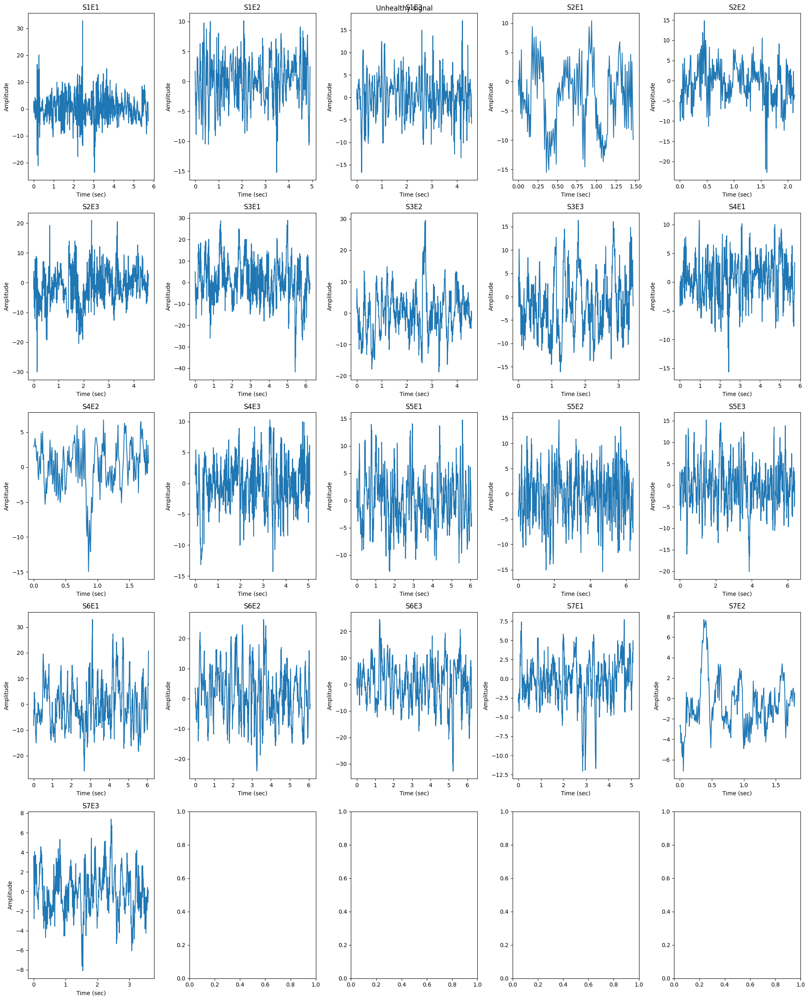

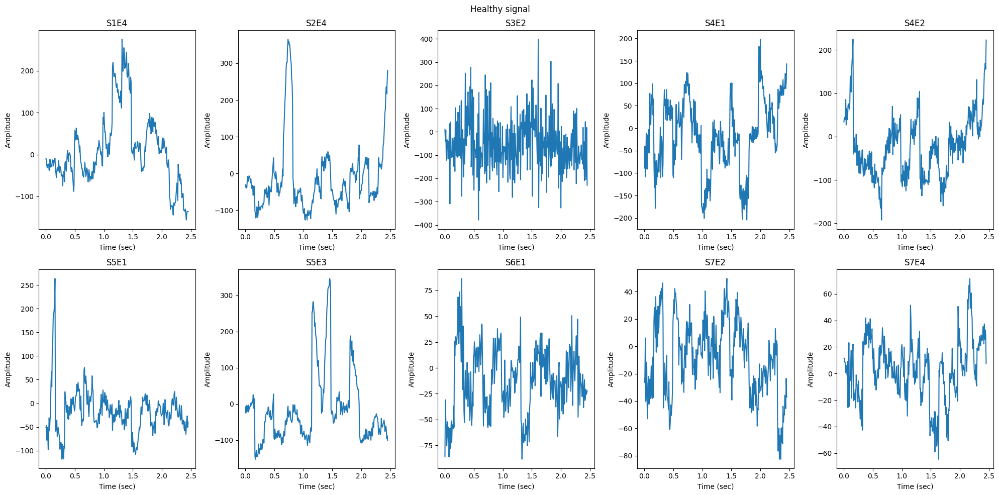

In [ ]:
def df_to_tensor_with_skip(df, label=None):
    # Skip the first row of the DataFrame
    df = df.iloc[1:]
    # Convert DataFrame to NumPy array with float32 dtype
    array = np.array(df, dtype=np.float32)
    # Convert NumPy array to tensor
    tensor = torch.tensor(array, device=device)

    return tensor, label

#Convert tensor with label
def convert_to_tensors_with_labels_with_skip(dataframes, labels):
    tensors_with_labels = []
    for df, label in zip(dataframes, labels):
        tensor, labeled_tensor = df_to_tensor_with_skip(df, label=label)
        tensors_with_labels.append((tensor, labeled_tensor))
    return tensors_with_labels

unhealthy_tensors = convert_to_tensors_with_labels_with_skip(unhealthy_dataframe, labels_unhealthy[:len(unhealthy_dataframe)])
healthy_tensors = convert_to_tensors_with_labels_with_skip(healthy_dataframe, labels_healthy[:len(healthy_dataframe)])

Fs = 128
Ts = 1.0/Fs

def plot_random_signal(tensor_list, title):
    num_signals = len(tensor_list)
    num_cols = 5  # Number of columns in each row
    num_rows = (num_signals + num_cols - 1) // num_cols  # Calculate number of rows needed

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))
    fig.suptitle(title)

    for i, (tensor, label) in enumerate(tensor_list):
        row = i // num_cols
        col = i % num_cols
        sig_len = len(tensor[:, 0].detach().cpu().numpy()) / Fs
        t = np.arange(0, sig_len, Ts)

        ax = axes[row, col]
        ax.plot(t, tensor[:, 0].detach().cpu().numpy())
        ax.set_title(label)
        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

plot_random_signal(unhealthy_tensors, 'Unhealthy signal')
plot_random_signal(healthy_tensors, 'Healthy signal')

Preprocessing signals

In [ ]:
pip install mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 38.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import mne
from mne.filter import filter_data

fs = 128  # Sampling frequency in Hz
low_freq = 8  #Hz
high_freq = 30  #Hz


# Function to apply bandpass filter to EEG signals
def apply_bandpass_filter(df, low_freq, high_freq, fs):
    # Extract channel names from the first row
    ch_names = df.iloc[0].tolist()
    #remove the first row contain the channel row
    df = df.iloc[1:]
    # Convert DataFrame to MNE Raw object
    info = mne.create_info(ch_names=ch_names, sfreq=fs, ch_types='eeg')
    raw = mne.io.RawArray(df.values.T, info)

    # Apply bandpass filter using MNE-Python
    raw.filter(l_freq=low_freq, h_freq=high_freq)

    # Append the filtered channel names after the first row
    df = pd.concat([df.head(1), pd.DataFrame([raw.ch_names], columns=df.columns), df[1:]], ignore_index=True)

    #extract filtered data
    filtered_data = raw.get_data().T
    # Convert back to DataFrame
    df_filtered = pd.DataFrame(data=filtered_data, columns=ch_names)

    return df_filtered

# Apply the bandpass filter to each DataFrame
unhealthy_dataframe = [apply_bandpass_filter(df, low_freq, high_freq, fs) for df in unhealthy_dataframe]

healthy_dataframe = [apply_bandpass_filter(df, low_freq, high_freq, fs) for df in healthy_dataframe]

#Print each dataframe
print_dataframes_with_labels(unhealthy_dataframe, labels_unhealthy)
print_dataframes_with_labels(healthy_dataframe, labels_healthy)

Creating RawArray with float64 data, n_channels=13, n_times=735
    Range : 0 ... 734 =      0.000 ...     5.734 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 213 samples (1.664 s)

Creating RawArray with float64 data, n_channels=12, n_times=630
    Range : 0 ... 629 =      0.000 ...     4.914 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filte

C:\Users\franc\AppData\Local\Temp\ipykernel_18308\1528114799.py:22: RuntimeWarning: filter_length (213) is longer than the signal (189), distortion is likely. Reduce filter length or filter a longer signal.
  raw.filter(l_freq=low_freq, h_freq=high_freq)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


- Filter length: 213 samples (1.664 s)

Creating RawArray with float64 data, n_channels=16, n_times=231
    Range : 0 ... 230 =      0.000 ...     1.797 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 213 samples (1.664 s)

Creating RawArray with float64 data, n_channels=16, n_times=462
    Range : 0 ... 461 =      0.000 ...     3.602 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pas

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Normalization

In [ ]:
#function in order to normalize the data
def normalize_dataframes(dataframes_list):

    normalized_dataframes = []

    for df in dataframes_list:
        # Apply Min-Max scaling to normalize values between [0, 1]
        normalized_df = (df - df.min()) / (df.max() - df.min())
        normalized_dataframes.append(normalized_df)

    return normalized_dataframes

unhealthy_dataframe=normalize_dataframes(unhealthy_dataframe)

healthy_dataframe=normalize_dataframes(healthy_dataframe)

#Print each dataframe
print(f"---------UNHEALTHY:{len(unhealthy_dataframe)} Dataframe ---------")
print_dataframes_with_labels(unhealthy_dataframe, labels_unhealthy)
print("\n")
print(f"---------HEALTHY:{len(healthy_dataframe)} Dataframe ---------")
print_dataframes_with_labels(healthy_dataframe, labels_healthy)

---------UNHEALTHY:21 Dataframe ---------
Label: S1E1
Dataframe:
           C3        C4        Cz       CP1       CP2       CP5       CP6  \
0    0.507482  0.487852  0.524481  0.540239  0.544816  0.500061  0.379462   
1    0.600395  0.426889  0.493265  0.559177  0.495983  0.500515  0.425484   
2    0.566141  0.423182  0.457878  0.553691  0.494405  0.492795  0.395772   
3    0.528392  0.479332  0.454364  0.553417  0.531124  0.516325  0.389707   
4    0.560672  0.537926  0.497196  0.576301  0.559439  0.564259  0.424447   
..        ...       ...       ...       ...       ...       ...       ...   
730  0.723420  0.527590  0.562389  0.682868  0.531104  0.687280  0.424892   
731  0.787980  0.544025  0.541266  0.706966  0.518427  0.695167  0.512723   
732  0.583953  0.450690  0.491423  0.494390  0.492939  0.521970  0.345764   
733  0.408912  0.395455  0.477280  0.360703  0.497141  0.404386  0.216522   
734  0.507482  0.487852  0.524481  0.540239  0.544816  0.500061  0.379462   

          

###Taking only important channel of the signal

In [ ]:
# Keep only column 'C3' in each DataFrame
unhealthy_dataframe_c3 = [df[['C3']] for df in unhealthy_dataframe]
healthy_dataframe_c3 = [df[['C3']] for df in healthy_dataframe]

#Print each dataframe
print(f"---------UNHEALTHY:{len(unhealthy_dataframe_c3)} Dataframe ---------")
print_dataframes_with_labels(unhealthy_dataframe_c3, labels_unhealthy)
print("\n")
print(f"---------HEALTHY:{len(healthy_dataframe_c3)} Dataframe ---------")
print_dataframes_with_labels(healthy_dataframe_c3, labels_healthy)

---------UNHEALTHY:21 Dataframe ---------
Label: S1E1
Dataframe:
           C3
0    0.507482
1    0.600395
2    0.566141
3    0.528392
4    0.560672
..        ...
730  0.723420
731  0.787980
732  0.583953
733  0.408912
734  0.507482

[735 rows x 1 columns]
------------------
Label: S1E2
Dataframe:
           C3
0    0.590392
1    0.445378
2    0.446241
3    0.460148
4    0.356539
..        ...
625  0.425205
626  0.467220
627  0.457315
628  0.476054
629  0.590392

[630 rows x 1 columns]
------------------
Label: S1E3
Dataframe:
           C3
0    0.485057
1    0.507852
2    0.492043
3    0.454396
4    0.422302
..        ...
583  0.471774
584  0.507419
585  0.571894
586  0.571309
587  0.485057

[588 rows x 1 columns]
------------------
Label: S2E1
Dataframe:
           C3
0    0.461081
1    0.526715
2    0.494553
3    0.427604
4    0.437700
..        ...
184  0.611984
185  0.705621
186  0.942315
187  0.915737
188  0.461081

[189 rows x 1 columns]
------------------
Label: S2E2
Dataframe:

Transform to tensor

In [ ]:
def df_to_tensor(df, label=None):
    # Convert DataFrame to NumPy array with float32 dtype
    array = np.array(df, dtype=np.float32)

    # Convert NumPy array to tensor
    tensor = torch.tensor(array)

    return tensor, label

#Convert tensor with label
def convert_to_tensors_with_labels(dataframes, labels):
    tensors_with_labels = []
    for df, label in zip(dataframes, labels):
        tensor, labeled_tensor = df_to_tensor(df, label=label)
        tensors_with_labels.append((tensor, labeled_tensor))
    return tensors_with_labels

unhealthy_tensors = convert_to_tensors_with_labels(unhealthy_dataframe_c3, labels_unhealthy[:len(unhealthy_dataframe)])
healthy_tensors = convert_to_tensors_with_labels(healthy_dataframe_c3, labels_healthy[:len(healthy_dataframe)])

# Print the tensors with labels and shapes
print(f"---------UNHEALTHY:{len(unhealthy_tensors)} Tensor---------")
for tensor, label in unhealthy_tensors:
    print("Label:", label)
    print("Tensor Shape:", tensor.shape)
    print("Tensor:")
    print(tensor)
    print("------------------")

print("\n")

print(f"---------HEALTHY:{len(healthy_tensors)} Tensor---------")
for tensor, label in healthy_tensors:
    print("Label:", label)
    print("Tensor Shape:", tensor.shape)
    print("Tensor:")
    print(tensor)
    print("------------------")

---------UNHEALTHY:21 Tensor---------
Label: S1E1
Tensor Shape: torch.Size([735, 1])
Tensor:
tensor([[0.5075],
        [0.6004],
        [0.5661],
        [0.5284],
        [0.5607],
        [0.5448],
        [0.4906],
        [0.5358],
        [0.5941],
        [0.5085],
        [0.4180],
        [0.4730],
        [0.4938],
        [0.3789],
        [0.3637],
        [0.4907],
        [0.5035],
        [0.4715],
        [0.6728],
        [0.8449],
        [0.5771],
        [0.2606],
        [0.4785],
        [0.8365],
        [0.6458],
        [0.2266],
        [0.2575],
        [0.5081],
        [0.4348],
        [0.2688],
        [0.4263],
        [0.6502],
        [0.6226],
        [0.5856],
        [0.7137],
        [0.7345],
        [0.5678],
        [0.4918],
        [0.5088],
        [0.3631],
        [0.1679],
        [0.2513],
        [0.5208],
        [0.6381],
        [0.5954],
        [0.5909],
        [0.6170],
        [0.5729],
        [0.5150],
        [0.5114],
       

###Plot the signal after apply Band Pass filter

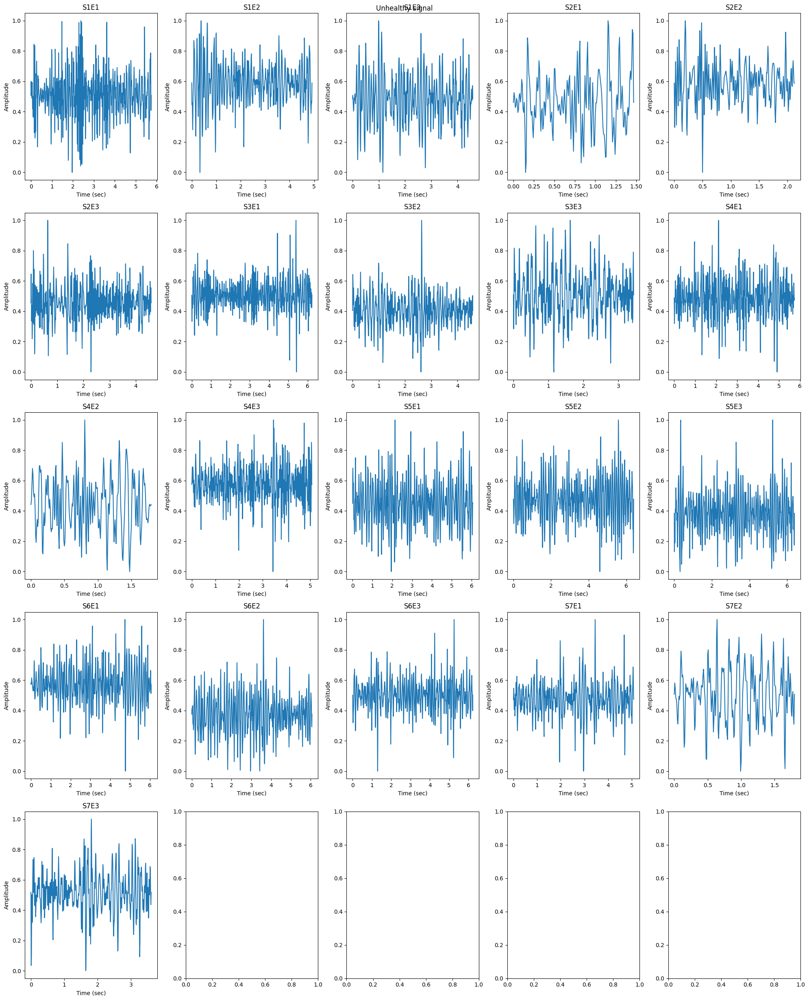

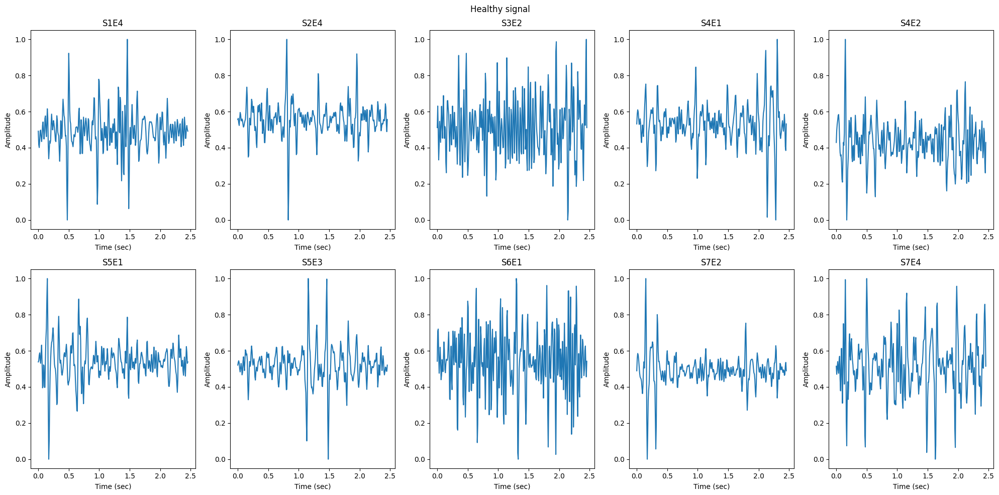

In [ ]:
import random

Fs = 128
Ts = 1.0/Fs

def plot_random_signal(tensor_list, title):
    num_signals = len(tensor_list)
    num_cols = 5  # Number of columns in each row
    num_rows = (num_signals + num_cols - 1) // num_cols  # Calculate number of rows needed

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))
    fig.suptitle(title)

    for i, (tensor, label) in enumerate(tensor_list):
        row = i // num_cols
        col = i % num_cols
        sig_len = len(tensor[:, 0].detach().cpu().numpy()) / Fs
        t = np.arange(0, sig_len, Ts)

        ax = axes[row, col]
        ax.plot(t, tensor[:, 0].detach().cpu().numpy())
        ax.set_title(label)
        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

plot_random_signal(unhealthy_tensors, 'Unhealthy signal')
plot_random_signal(healthy_tensors, 'Healthy signal')

###Filter tensor which have less common shape and set a common shape for this tensor in order to make similarity from each other

In [ ]:
def filter_tensors(labeled_tensors, threshold_shape):
    filtered_tensors = []
    for tensor, label in labeled_tensors:
        if tensor.shape[0] >= threshold_shape[0] and tensor.shape[1] >= threshold_shape[1]:
            # If tensor shape is larger than threshold, resize or crop it
            tensor_filtered = tensor[:threshold_shape[0], :threshold_shape[1]]

            filtered_tensors.append((tensor_filtered, label))

    return filtered_tensors

# Define the threshold shape
threshold_unhealthy = (150, 1)
threshold_healthy = (150, 1)

unhealthy_tensors_train = filter_tensors(unhealthy_tensors, threshold_unhealthy)
healthy_tensors_train = filter_tensors(healthy_tensors, threshold_healthy)

# Print the tensors with labels and shapes
print(f"---------UNHEALTHY:{len(unhealthy_tensors)} Tensor---------")
for tensor, label in unhealthy_tensors_train:
    print("Label:", label)
    print("Tensor Shape:", tensor.shape)
    print("Tensor:")
    print(tensor)
    print("------------------")

print("\n")

print(f"---------HEALTHY:{len(healthy_tensors)} Tensor---------")
for tensor, label in healthy_tensors_train:
    print("Label:", label)
    print("Tensor Shape:", tensor.shape)
    print("Tensor:")
    print(tensor)
    print("------------------")

---------UNHEALTHY:21 Tensor---------
Label: S1E1
Tensor Shape: torch.Size([150, 1])
Tensor:
tensor([[0.5075],
        [0.6004],
        [0.5661],
        [0.5284],
        [0.5607],
        [0.5448],
        [0.4906],
        [0.5358],
        [0.5941],
        [0.5085],
        [0.4180],
        [0.4730],
        [0.4938],
        [0.3789],
        [0.3637],
        [0.4907],
        [0.5035],
        [0.4715],
        [0.6728],
        [0.8449],
        [0.5771],
        [0.2606],
        [0.4785],
        [0.8365],
        [0.6458],
        [0.2266],
        [0.2575],
        [0.5081],
        [0.4348],
        [0.2688],
        [0.4263],
        [0.6502],
        [0.6226],
        [0.5856],
        [0.7137],
        [0.7345],
        [0.5678],
        [0.4918],
        [0.5088],
        [0.3631],
        [0.1679],
        [0.2513],
        [0.5208],
        [0.6381],
        [0.5954],
        [0.5909],
        [0.6170],
        [0.5729],
        [0.5150],
        [0.5114],
       

###Save and load tensor

In [ ]:
# Saving the lists to a file
path='/content/drive/Othercomputers/Il mio computer/AI & Robotics/Project/Napoli/Saves/Signal_tensors'

#torch.save(unhealthy_tensors, path+'unhealthy_tensors.pt')
#torch.save(healthy_tensors, path+'healthy_tensors.pt')

# Loading the lists from the file
unhealthy = torch.load(path+'/unhealthy_tensors.pt')
healthy = torch.load(path+'/healthy_tensors.pt')

###Dataloader

In [ ]:
#Create a DataLoader for the training unhealthy and healthy data
batch_size = 32

unhealthy_loader_train = DataLoader(unhealthy_tensors_train, batch_size=batch_size, shuffle=True)
healthy_loader_train = DataLoader(healthy_tensors_train, batch_size=batch_size, shuffle=True)

#GAN

###GENERATOR

LSTM Layer

In [ ]:
#GENERATOR 1 - LSTM (too powerful for this type of dataset)
class Generator(nn.Module):
    def __init__(self, input_size, output_size, hidden_size=25, num_layers=1):
        super(Generator, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        batch_size = x.size(0)  # Get the batch size
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_size).to(x.device)
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, :])
        out = self.sigmoid(out)
        return out

Residual Neural Network

In [ ]:
# Define the Residual Block
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(in_channels),
            nn.ReLU(inplace=True),
            nn.Conv1d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(in_channels)
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(x + self.block(x))

# Generator network
class Generator(nn.Module):
    def __init__(self, input_size, output_size, seq_len):
        super(Generator, self).__init__()

        # First layer: Conv1d with kernel size 3, stride 1 (k3n64s1)
        self.initial_layer = nn.Sequential(
            nn.Conv1d(in_channels=input_size, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True)
        )

        # Residual blocks (B residual blocks)
        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(64) for _ in range(16)]  # 16 residual blocks
        )

        # Deconvolution layers
        self.deconv_layers = nn.Sequential(
            nn.ConvTranspose1d(in_channels=64, out_channels=64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True)
        )

        # Final output layer: Conv1d (k3n64s1)
        self.output_layer = nn.Sequential(
            nn.Conv1d(in_channels=64, out_channels=1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.initial_layer(x)
        x = self.residual_blocks(x)
        x = self.deconv_layers(x)
        x = self.output_layer(x)
        return x

###DISCRIMINATOR

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_size, seq_len):
        super(Discriminator, self).__init__()

        # Define convolutional layers, following the architecture in the figure
        self.conv_layers = nn.Sequential(
            # First Conv Layer: n64s1 (input: 1 channel, output: 64 channels)
            nn.Conv1d(in_channels=input_size, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(0.2, inplace=True),

            # Second Conv Layer: n64s2
            nn.Conv1d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # Third Conv Layer: n128s1
            nn.Conv1d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # Fourth Conv Layer: n128s2
            nn.Conv1d(in_channels=256, out_channels=512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # Fifth Conv Layer: n256s1
            nn.Conv1d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # Sixth Conv Layer: n256s2
            nn.Conv1d(in_channels=512, out_channels=1024, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),

            # Seventh Conv Layer: n512s1
            nn.Conv1d(in_channels=1024, out_channels=1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),

            # Eighth Conv Layer: n512s2
            nn.Conv1d(in_channels=1024, out_channels=1024, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # Fully Connected Layer
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc(x)
        return x

#Training

Plot Function

In [ ]:
def plot_eeg_signals(epoch, noisy_signal, denoised_signal, clean_signal):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.plot(noisy_signal.cpu().detach().numpy().squeeze(), label='Noisy')
    plt.title(f"Noisy EEG (Epoch {epoch})")

    plt.subplot(1, 3, 2)
    plt.plot(denoised_signal.cpu().detach().numpy().squeeze(), label='Denoised')
    plt.title(f"Denoised EEG (Epoch {epoch})")

    plt.subplot(1, 3, 3)
    plt.plot(clean_signal.cpu().detach().numpy().squeeze(), label='Clean')
    plt.title(f"Clean EEG (Epoch {epoch})")

    plt.tight_layout()
    plt.show()

##GAN with KL-Divergence loss

C:\Users\franc\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([150, 1])) that is different to the input size (torch.Size([150, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [0/50], Generator Loss: 1.5912, Discriminator Loss: 0.7161


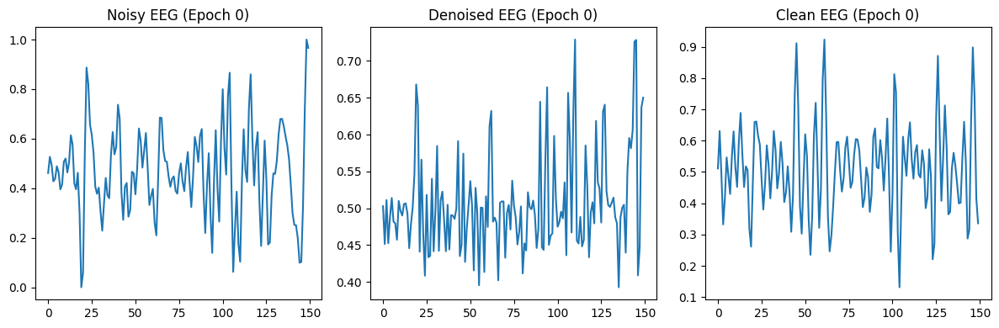

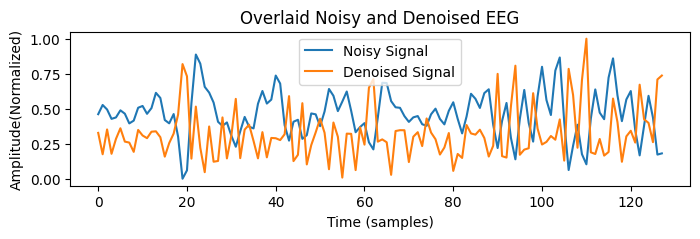

Epoch [1/50], Generator Loss: 1.7576, Discriminator Loss: 1.3607


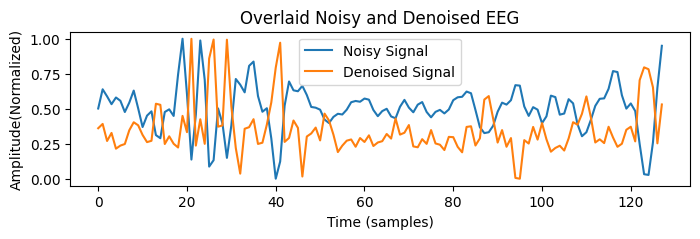

Epoch [2/50], Generator Loss: 1.6191, Discriminator Loss: 1.8660


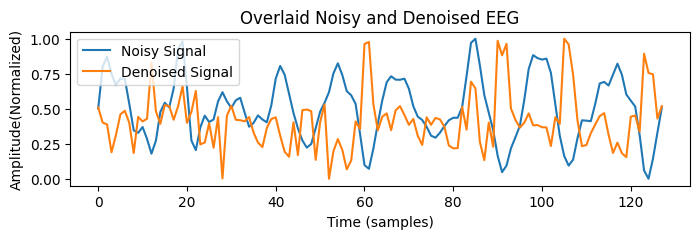

Epoch [3/50], Generator Loss: 0.8197, Discriminator Loss: 1.5069


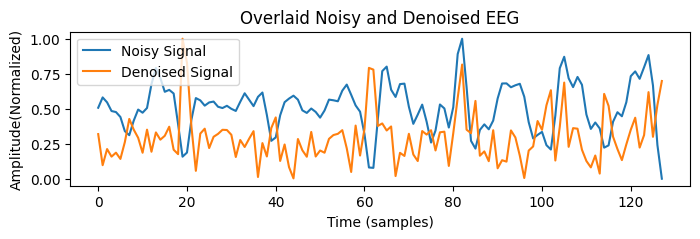

Epoch [4/50], Generator Loss: 0.7904, Discriminator Loss: 0.7537


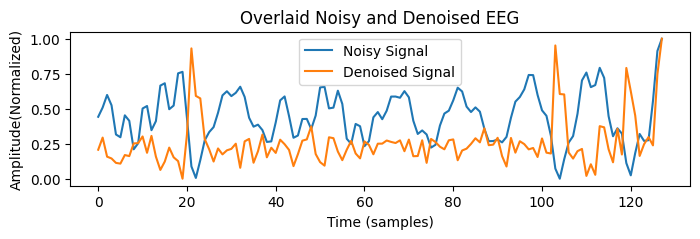

Epoch [5/50], Generator Loss: 0.8134, Discriminator Loss: 0.7003


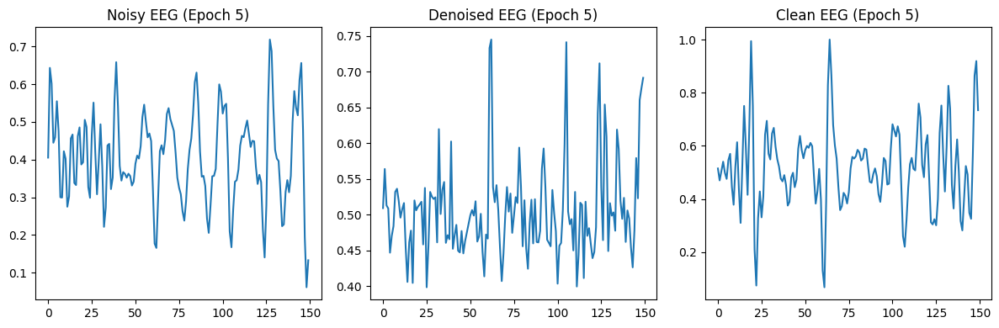

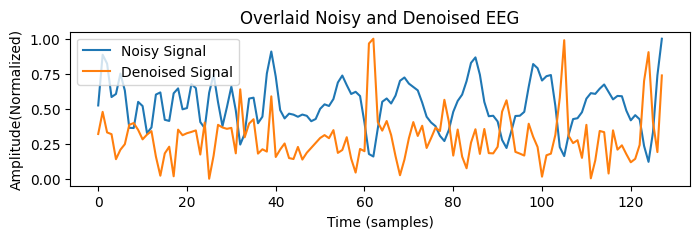

Epoch [6/50], Generator Loss: 0.8218, Discriminator Loss: 0.6946


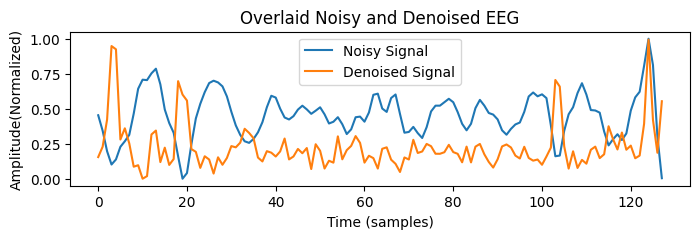

Epoch [7/50], Generator Loss: 0.8022, Discriminator Loss: 0.6920


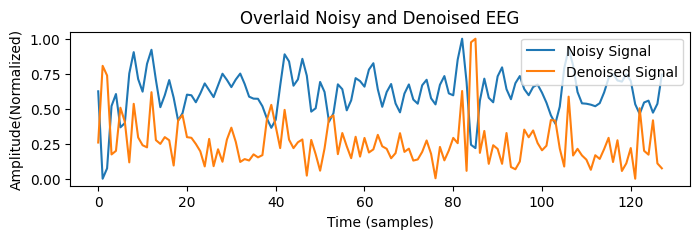

Epoch [8/50], Generator Loss: 0.8092, Discriminator Loss: 0.6846


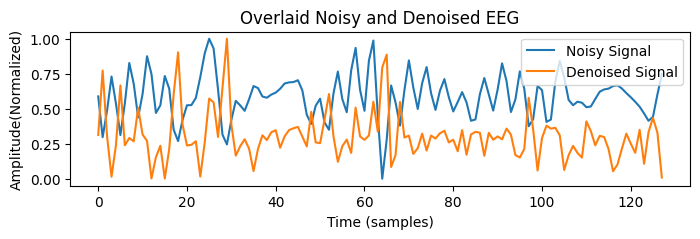

Epoch [9/50], Generator Loss: 0.8265, Discriminator Loss: 0.6856


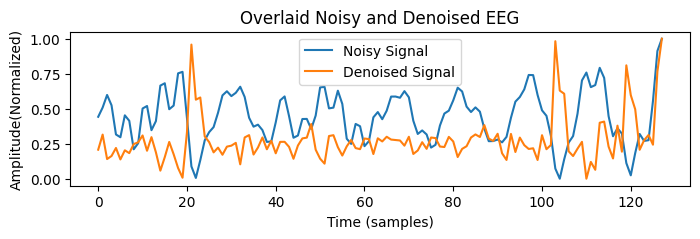

Epoch [10/50], Generator Loss: 0.8572, Discriminator Loss: 0.6783


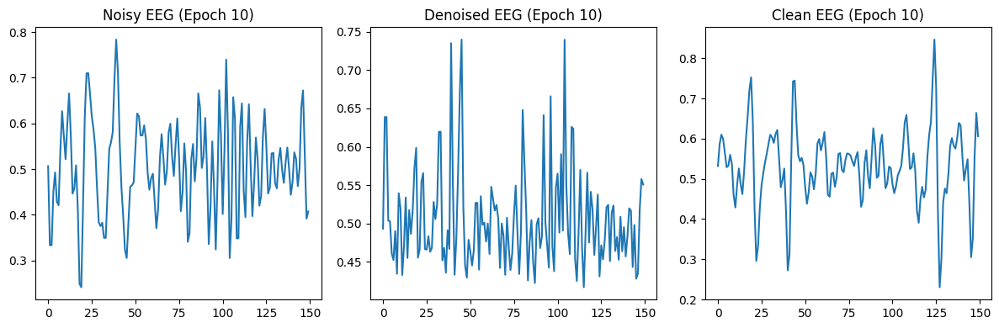

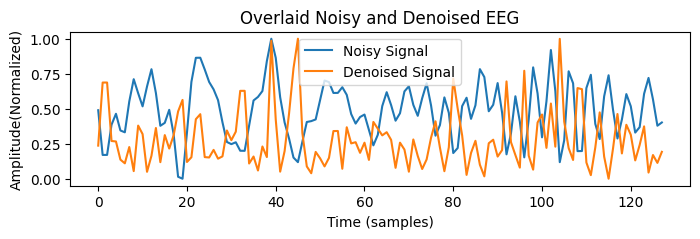

Epoch [11/50], Generator Loss: 0.8475, Discriminator Loss: 0.6856


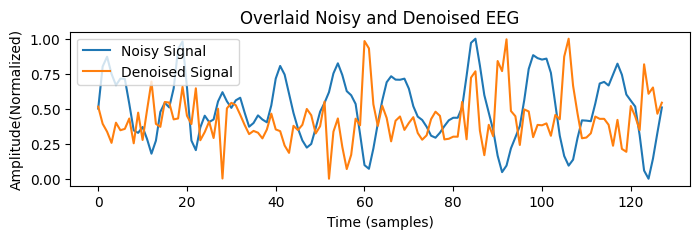

Epoch [12/50], Generator Loss: 0.9115, Discriminator Loss: 0.6671


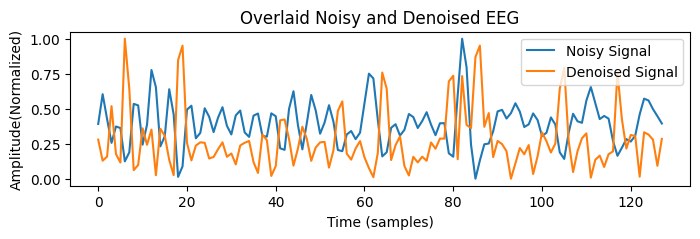

Epoch [13/50], Generator Loss: 0.8793, Discriminator Loss: 0.6912


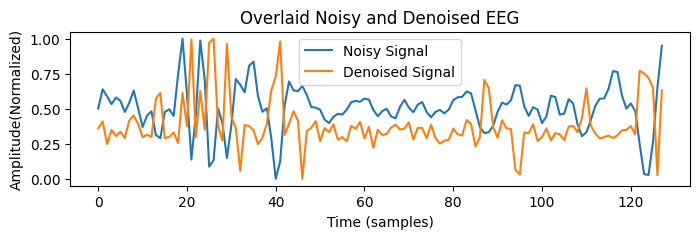

Epoch [14/50], Generator Loss: 0.8986, Discriminator Loss: 0.6740


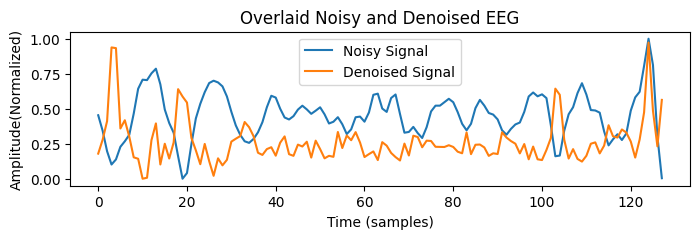

Epoch [15/50], Generator Loss: 0.9596, Discriminator Loss: 0.6644


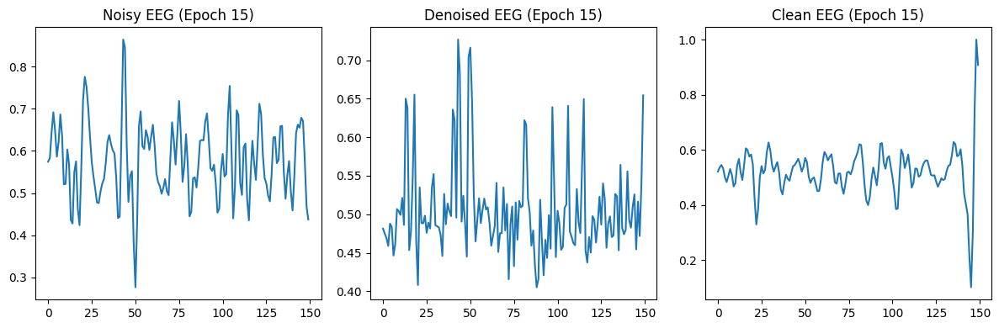

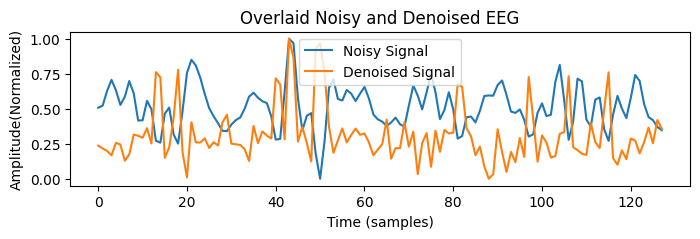

Epoch [16/50], Generator Loss: 0.9066, Discriminator Loss: 0.6737


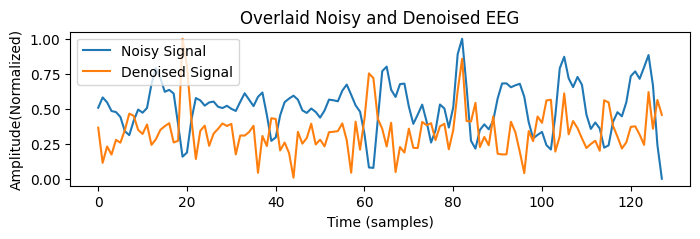

Epoch [17/50], Generator Loss: 0.8912, Discriminator Loss: 0.6785


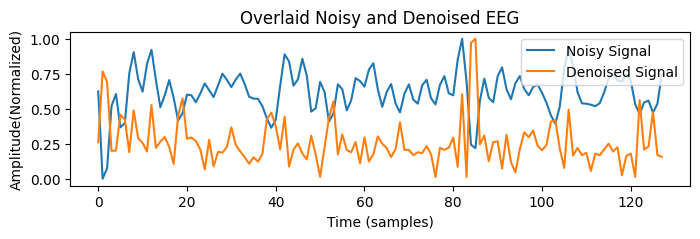

Epoch [18/50], Generator Loss: 0.8420, Discriminator Loss: 0.6822


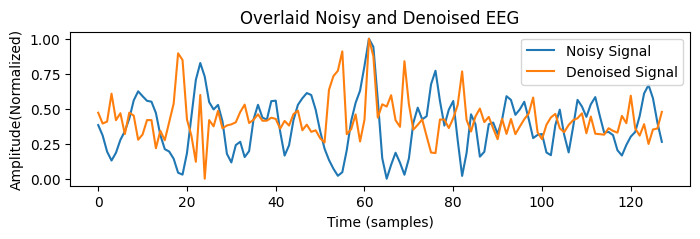

Epoch [19/50], Generator Loss: 0.8558, Discriminator Loss: 0.6678


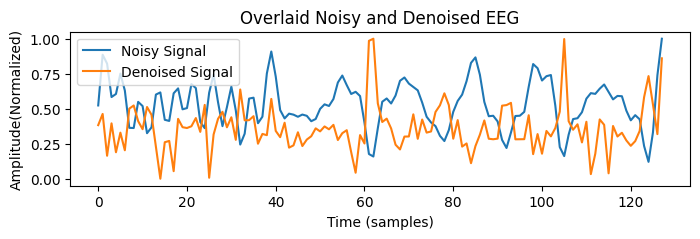

Epoch [20/50], Generator Loss: 0.8584, Discriminator Loss: 0.6647


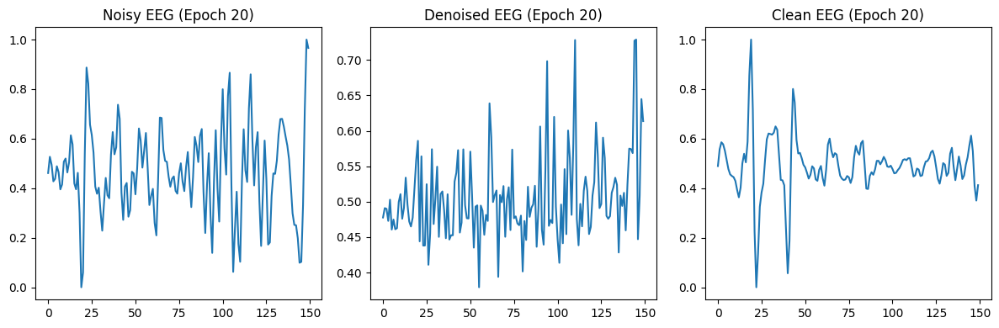

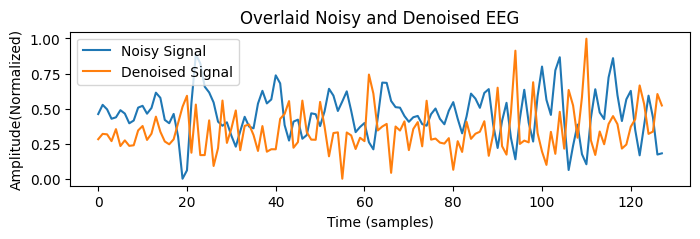

Epoch [21/50], Generator Loss: 0.9422, Discriminator Loss: 0.6600


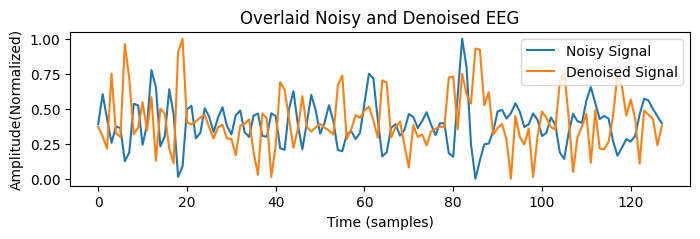

Epoch [22/50], Generator Loss: 0.8914, Discriminator Loss: 0.6535


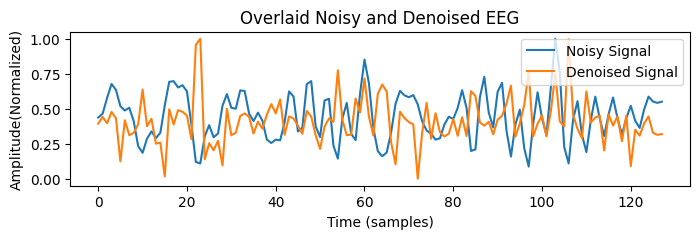

Epoch [23/50], Generator Loss: 0.9945, Discriminator Loss: 0.6580


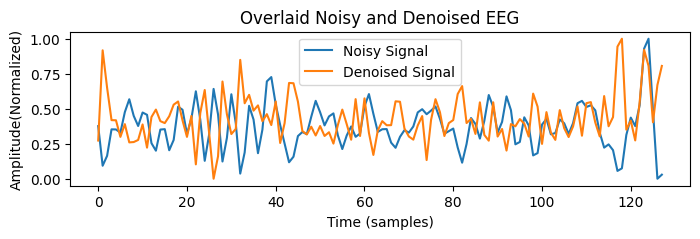

Epoch [24/50], Generator Loss: 0.8896, Discriminator Loss: 0.7145


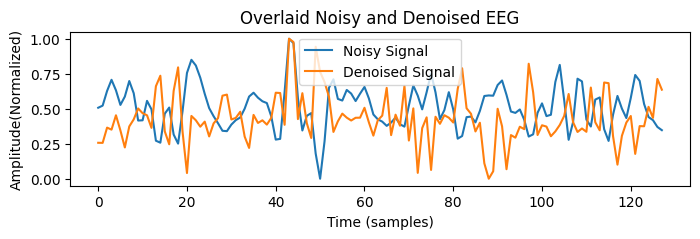

Epoch [25/50], Generator Loss: 0.9004, Discriminator Loss: 0.7149


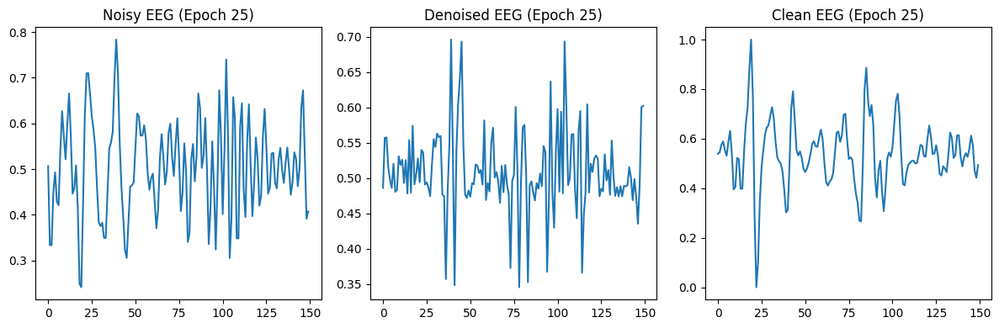

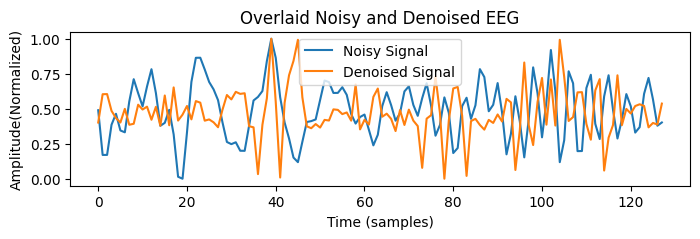

Epoch [26/50], Generator Loss: 0.8224, Discriminator Loss: 0.7258


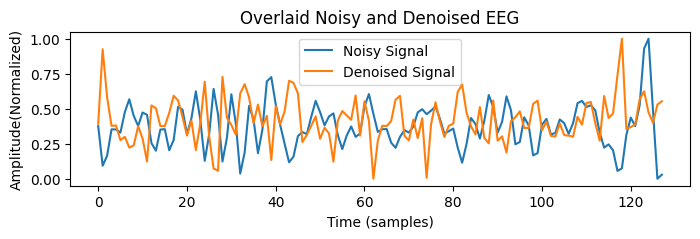

Epoch [27/50], Generator Loss: 0.8039, Discriminator Loss: 0.6920


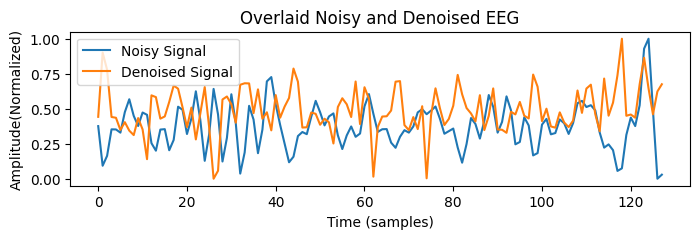

Epoch [28/50], Generator Loss: 0.8129, Discriminator Loss: 0.6866


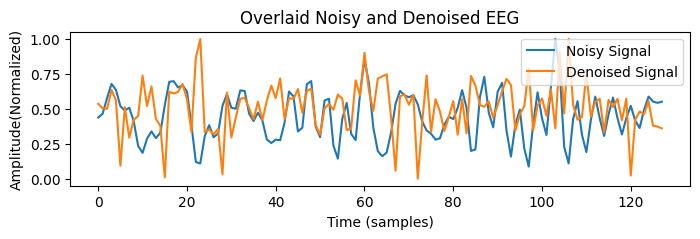

Epoch [29/50], Generator Loss: 0.8973, Discriminator Loss: 0.6803


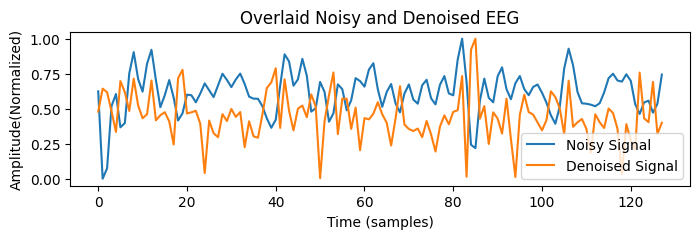

Epoch [30/50], Generator Loss: 0.8506, Discriminator Loss: 0.6468


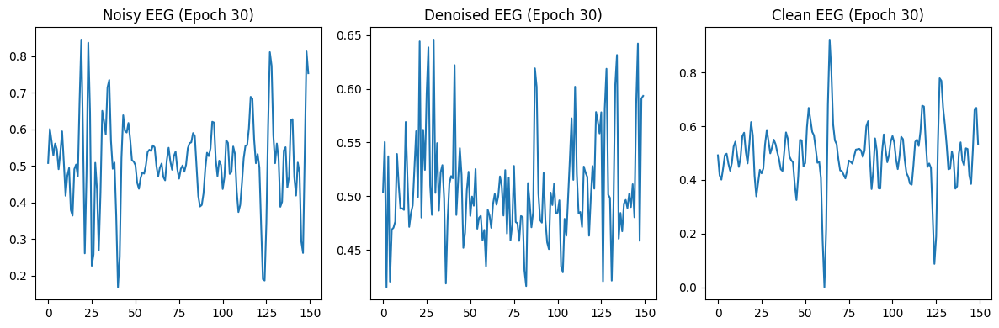

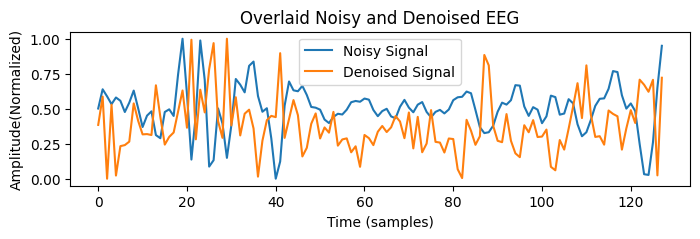

Epoch [31/50], Generator Loss: 0.9250, Discriminator Loss: 0.7162


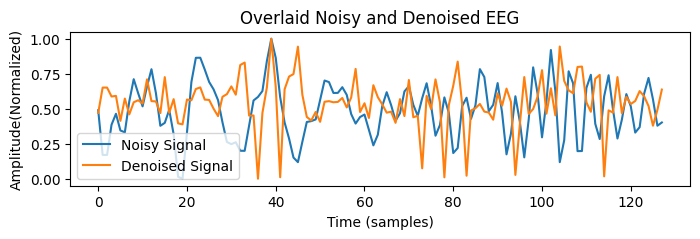

Epoch [32/50], Generator Loss: 0.9444, Discriminator Loss: 0.6977


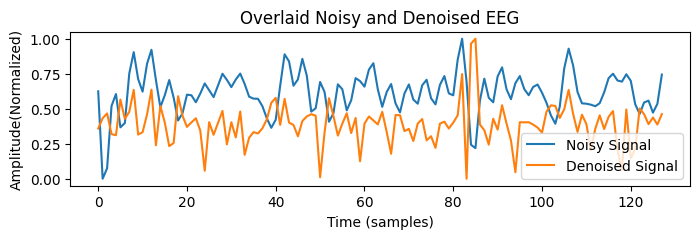

Epoch [33/50], Generator Loss: 0.8941, Discriminator Loss: 0.7007


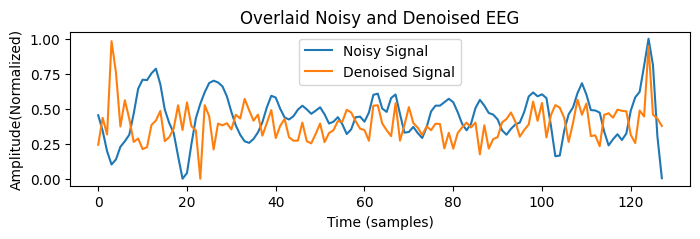

Epoch [34/50], Generator Loss: 0.7934, Discriminator Loss: 0.6897


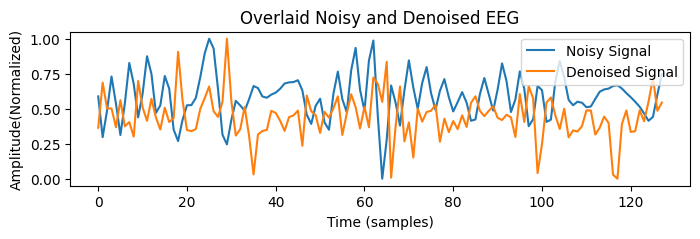

Epoch [35/50], Generator Loss: 0.7381, Discriminator Loss: 0.7031


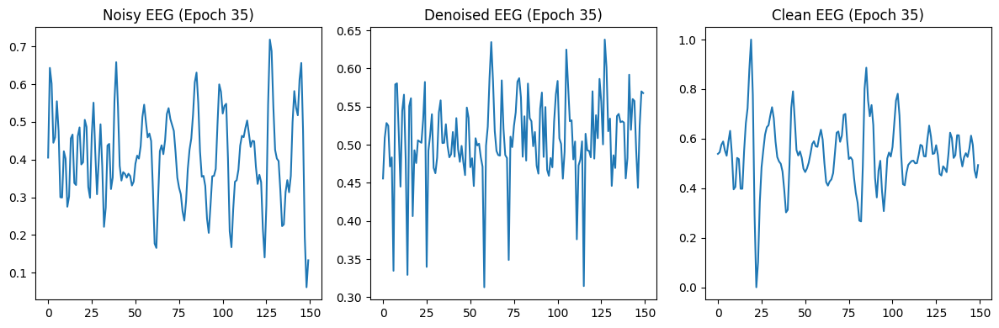

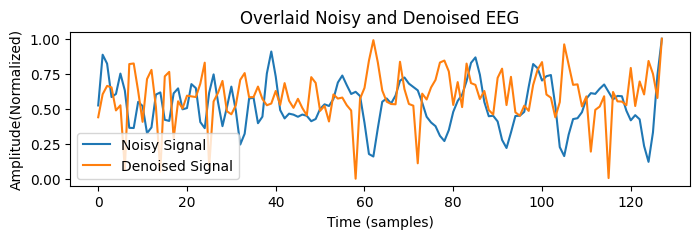

Epoch [36/50], Generator Loss: 0.8671, Discriminator Loss: 0.6884


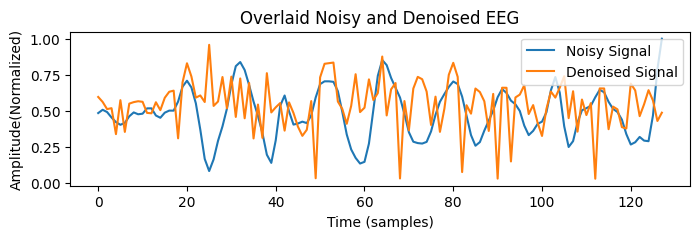

Epoch [37/50], Generator Loss: 0.8119, Discriminator Loss: 0.7137


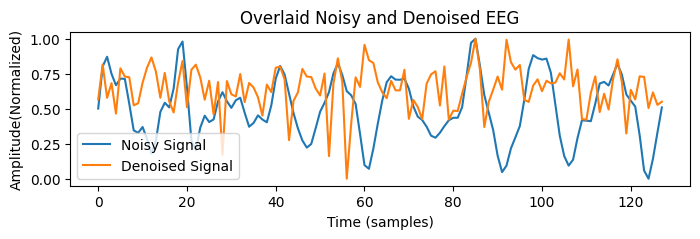

Epoch [38/50], Generator Loss: 0.8915, Discriminator Loss: 0.7018


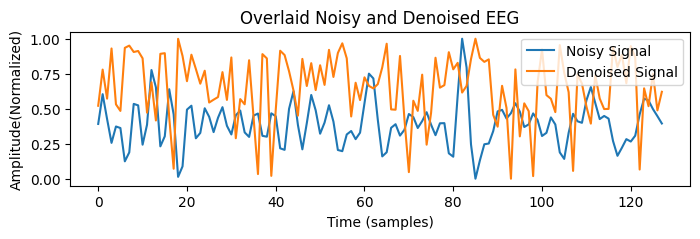

Epoch [39/50], Generator Loss: 0.8772, Discriminator Loss: 0.6975


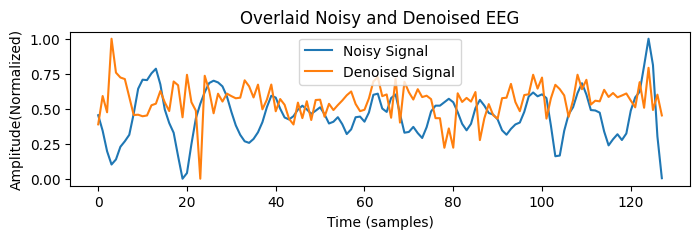

Epoch [40/50], Generator Loss: 0.9062, Discriminator Loss: 0.6739


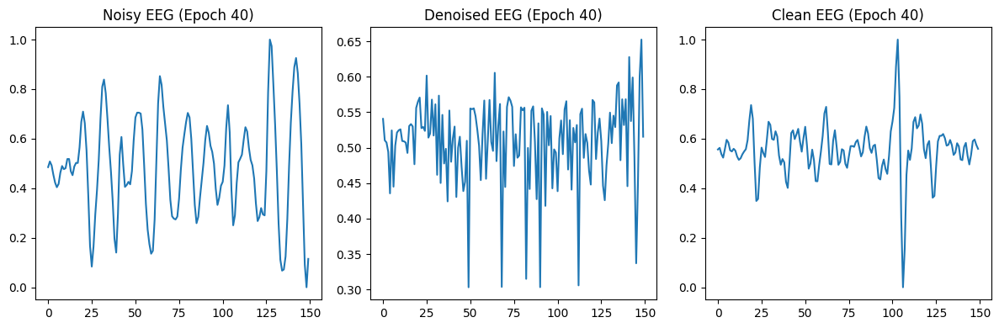

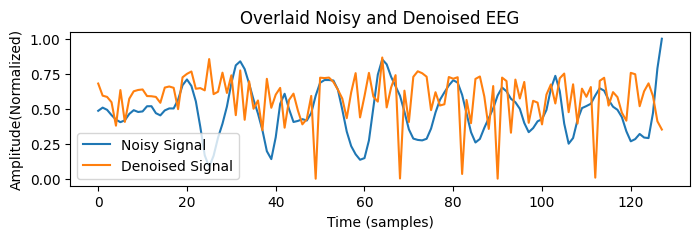

Epoch [41/50], Generator Loss: 0.8555, Discriminator Loss: 0.7008


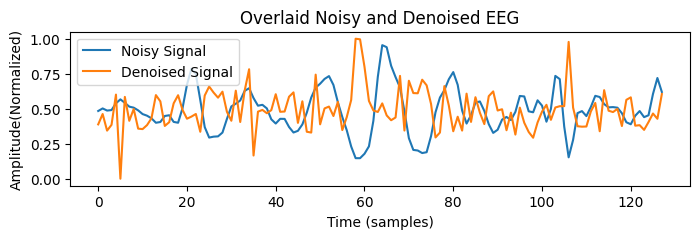

Epoch [42/50], Generator Loss: 0.8959, Discriminator Loss: 0.6714


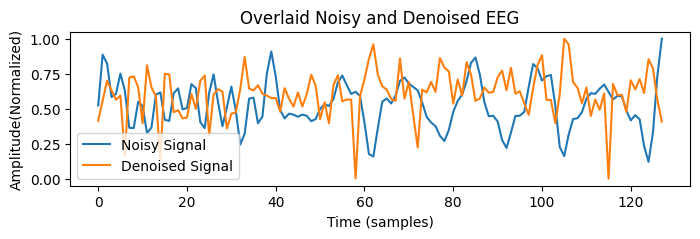

Epoch [43/50], Generator Loss: 0.8694, Discriminator Loss: 0.6782


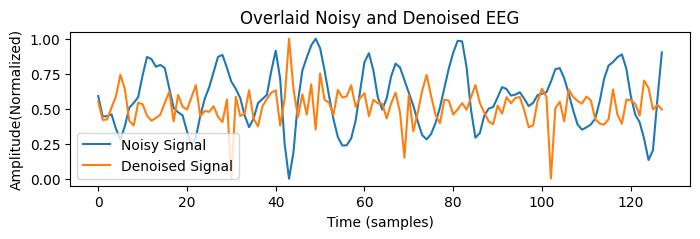

Epoch [44/50], Generator Loss: 0.8001, Discriminator Loss: 0.6861


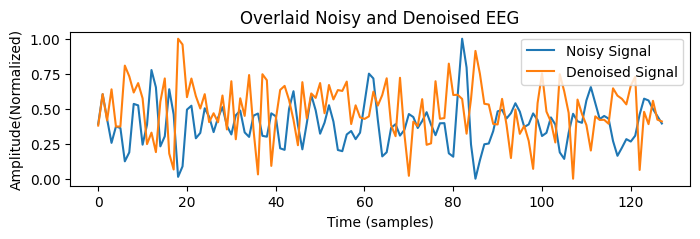

Epoch [45/50], Generator Loss: 0.8976, Discriminator Loss: 0.7011


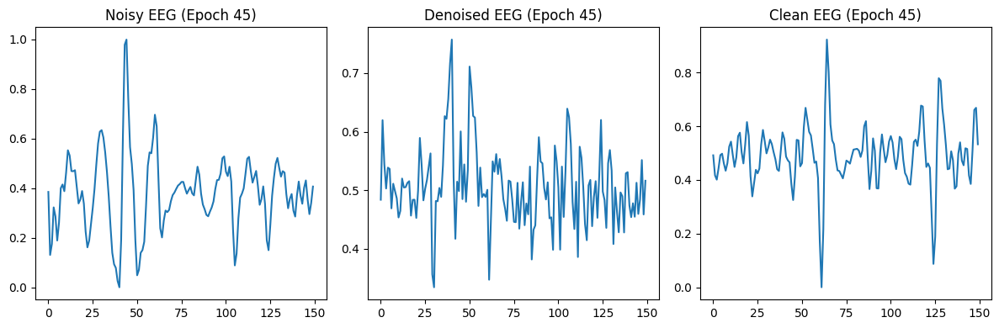

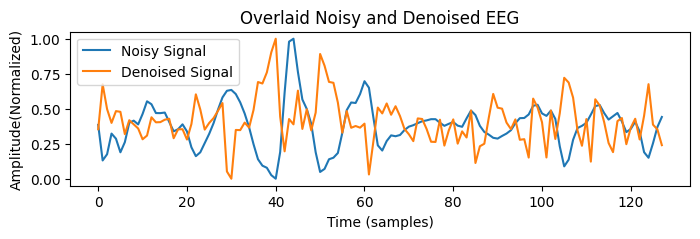

Epoch [46/50], Generator Loss: 0.7970, Discriminator Loss: 0.7610


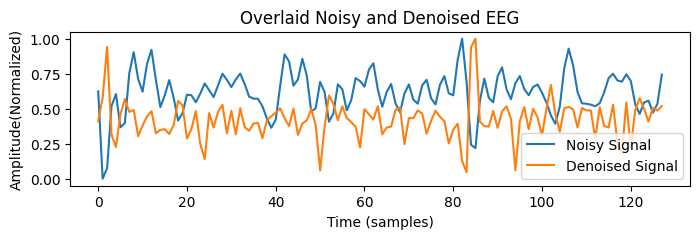

Epoch [47/50], Generator Loss: 0.7642, Discriminator Loss: 0.6994


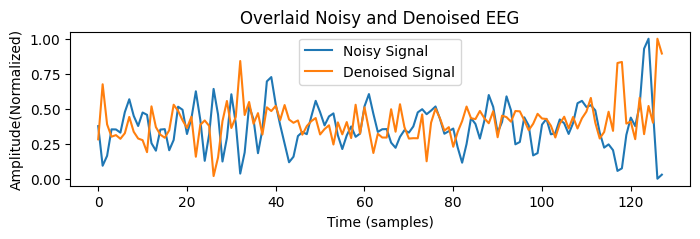

Epoch [48/50], Generator Loss: 0.8586, Discriminator Loss: 0.7071


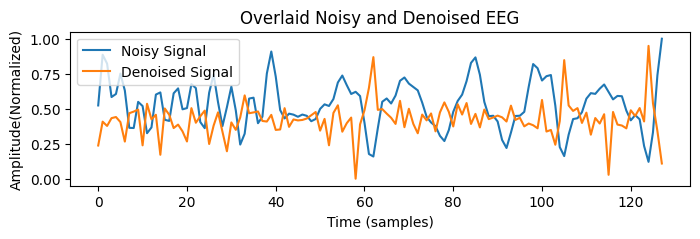

Epoch [49/50], Generator Loss: 0.8187, Discriminator Loss: 0.7030


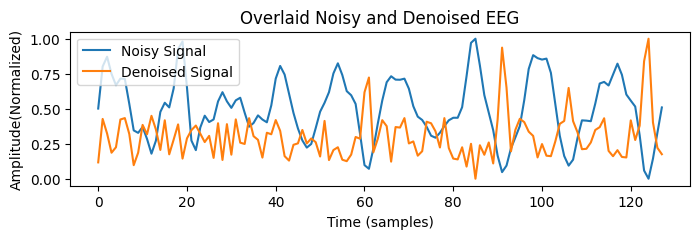

In [ ]:
from torch.nn import KLDivLoss
import torch.nn.functional as F

save_path= '/content/drive/MyDrive/Progetti_Uni/BCI Signal Reconstruction Projects (Napoli)/Saves/GAN'

'''
def train_EEGgan(generator, discriminator, noisy_dataloader, clean_dataloader, num_epochs=100, lr=0.00002, plot_interval=5):

    criterion = nn.KLDivLoss(reduction="batchmean", log_target=False)
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    generator.train()
    discriminator.train()

    generator_losses = []
    discriminator_losses = []

    for epoch in range(num_epochs):

        for (noisy, _), (clean, _) in zip(noisy_dataloader, clean_dataloader):

            clean_eeg = clean[0].to(device)
            noisy_eeg = noisy[0].to(device)

            real_labels = torch.ones(clean_eeg.size(0), 1).to(device)
            fake_labels = torch.zeros(clean_eeg.size(0), 1).to(device)

            # ====================
            # Train Discriminator
            # ====================
            optimizer_d.zero_grad()

            real_outputs = discriminator(clean_eeg.unsqueeze(2)).to(device)

            # Compute the loss for real samples
            d_loss_real = criterion(real_outputs, real_labels)

            denoised_data = generator(noisy_eeg.unsqueeze(2)).to(device)
            fake_outputs = discriminator(denoised_data.squeeze(0)).to(device)

            #Compute the loss for fake samples
            d_loss_fake = criterion(fake_outputs, fake_labels)

            loss_D = (0.5 *(d_loss_real + d_loss_fake))
            loss_D.backward()
            optimizer_d.step()

            # ====================
            # Train Generator
            # ====================
            optimizer_g.zero_grad()
            denoised_data = generator(noisy_eeg.unsqueeze(2))
            fake_outputs = discriminator(denoised_data.squeeze(0)).to(device)

            # Content KL-div loss
            loss_G = criterion(denoised_data, clean_eeg)

            loss_G.backward()
            optimizer_g.step()


        generator_losses.append(loss_G.item())
        discriminator_losses.append(loss_D.item())

        print(f"Epoch [{epoch}/{num_epochs}], Generator Loss: {loss_G.item():.4f}, Discriminator Loss: {loss_D.item():.4f}")

        # Plot signals at specified intervals
        #if epoch % plot_interval == 0:
            #plot_eeg_signals(epoch, noisy_eeg, denoised_data, clean_eeg)

    return generator_losses, discriminator_losses
'''


def train_EEGgan(generator, discriminator, noisy_dataloader, clean_dataloader, num_epochs=100, lr=0.01, plot_interval=5):

    adversarial_loss = nn.BCELoss()
    content_loss = nn.MSELoss()
    kl_div_loss = nn.KLDivLoss(reduction="batchmean", log_target=False)  # Optional KL-divergence

    optimizer_g = optim.Adam(generator.parameters(), lr=0.00002, betas=(0.5, 0.999))
    optimizer_d = optim.Adam(discriminator.parameters(), lr=0.002, betas=(0.5, 0.999))

    generator.train()
    discriminator.train()

    generator_losses = []
    discriminator_losses = []

    for epoch in range(num_epochs):
        for (noisy, _), (clean, _) in zip(noisy_dataloader, clean_dataloader):

            clean_eeg = clean[0].to(device)
            noisy_eeg = noisy[0].to(device)

            real_labels = torch.ones(clean_eeg.size(0), 1).to(device)
            fake_labels = torch.zeros(clean_eeg.size(0), 1).to(device)

            # ====================
            # Train Discriminator
            # ====================
            optimizer_d.zero_grad()

            real_outputs = discriminator(clean_eeg.unsqueeze(2)).to(device)
            d_loss_real = adversarial_loss(real_outputs, real_labels)

            denoised_data = generator(noisy_eeg.unsqueeze(2)).to(device)
            fake_outputs = discriminator(denoised_data.squeeze(0)).to(device)
            d_loss_fake = adversarial_loss(fake_outputs, fake_labels)

            loss_D = (d_loss_real + d_loss_fake) / 2
            loss_D.backward()
            optimizer_d.step()

            # ====================
            # Train Generator
            # ====================
            optimizer_g.zero_grad()

            denoised_data = generator(noisy_eeg.unsqueeze(2))
            fake_outputs = discriminator(denoised_data.squeeze(0)).to(device)

            # Adversarial loss
            loss_G_adv = adversarial_loss(fake_outputs, real_labels)

            # Content loss (MSE)
            loss_G_content = content_loss(denoised_data, real_labels)

            # Optional KL-divergence loss
            denoised_data_log = F.log_softmax(denoised_data, dim=1)
            clean_eeg_softmax = F.softmax(clean_eeg, dim=1)
            loss_G_kl = kl_div_loss(denoised_data_log, clean_eeg_softmax)

            # Combined generator loss
            loss_G = loss_G_adv + 0.5 * loss_G_content + 0.1 * loss_G_kl

            loss_G.backward()
            optimizer_g.step()

        generator_losses.append(loss_G.item())
        discriminator_losses.append(loss_D.item())

        print(f"Epoch [{epoch}/{num_epochs}], Generator Loss: {loss_G.item():.4f}, Discriminator Loss: {loss_D.item():.4f}")

        # Plot signals at specified intervals
        if epoch % plot_interval == 0:
            plot_eeg_signals(epoch, noisy_eeg, denoised_data, clean_eeg)

        # Normalize the signals
        noisy_normalized = (noisy_eeg - torch.min(noisy_eeg)) / (torch.max(noisy_eeg) - torch.min(noisy_eeg))
        denoised_normalized = (denoised_data - torch.min(denoised_data)) / (torch.max(denoised_data) - torch.min(denoised_data))

        # Plot the normalized signals overlaid
        plt.figure(figsize=(8, 2))
        plt.plot(noisy_normalized[:128, 0].detach().cpu().numpy(), label='Noisy Signal')
        plt.plot(denoised_normalized[:128, 0].detach().cpu().numpy(), label='Denoised Signal')
        plt.title('Overlaid Noisy and Denoised EEG')
        plt.xlabel('Time (samples)')
        plt.ylabel('Amplitude(Normalized)')
        plt.legend()
        plt.show()


    return generator_losses, discriminator_losses

input_size = 1 #channel of the each signal
output_size = 1
seq_len=150
num_epochs = 50

generator = Generator(input_size, output_size, seq_len).to(device)
discriminator = Discriminator(input_size, seq_len).to(device)

#Train the model
generator_losses, discriminator_losses= train_EEGgan(generator, discriminator, unhealthy_loader_train, healthy_loader_train, num_epochs=num_epochs)

##WGAN

Epoch [0/50], Generator Loss: -0.4388, Critic Loss: -0.0780


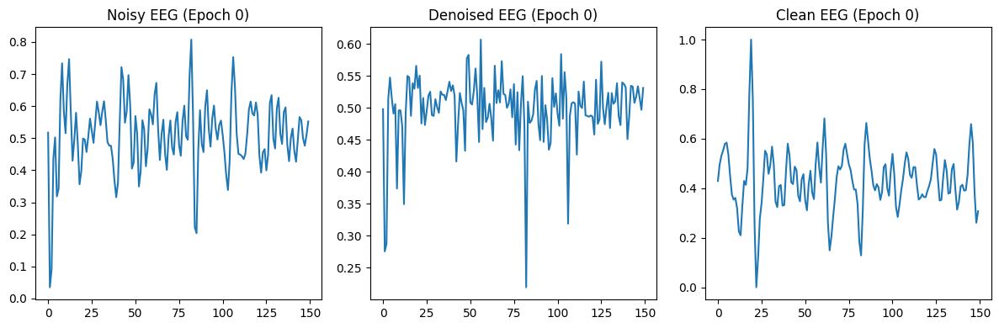

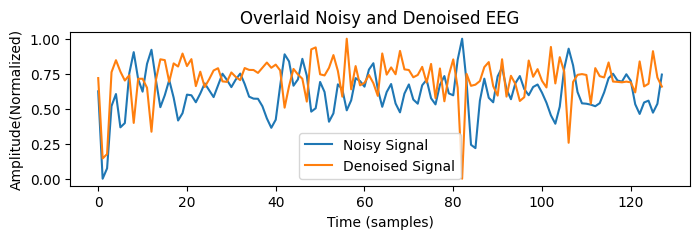

Epoch [1/50], Generator Loss: -0.4215, Critic Loss: -0.0474


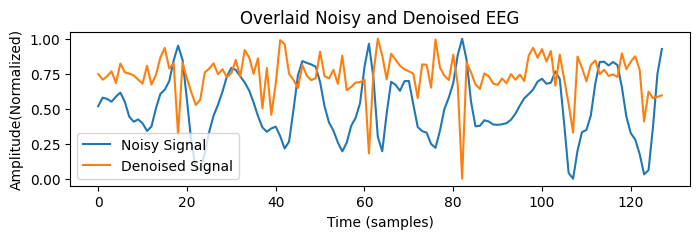

Epoch [2/50], Generator Loss: -0.4970, Critic Loss: -0.0279


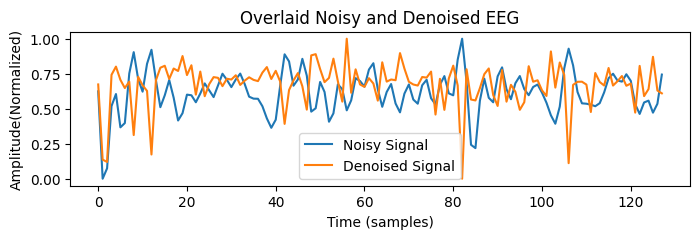

Epoch [3/50], Generator Loss: -0.4074, Critic Loss: -0.0840


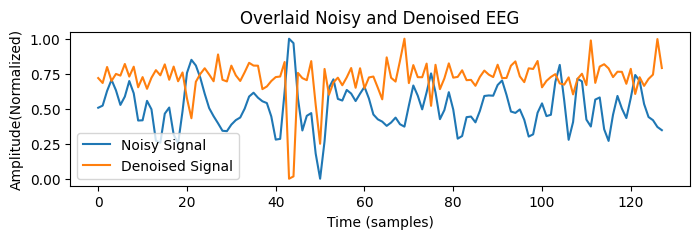

Epoch [4/50], Generator Loss: -0.3360, Critic Loss: -0.1853


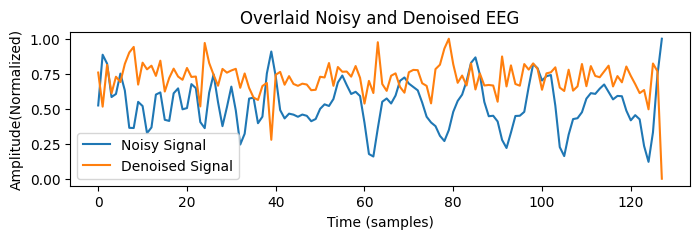

Epoch [5/50], Generator Loss: -0.4116, Critic Loss: -0.0176


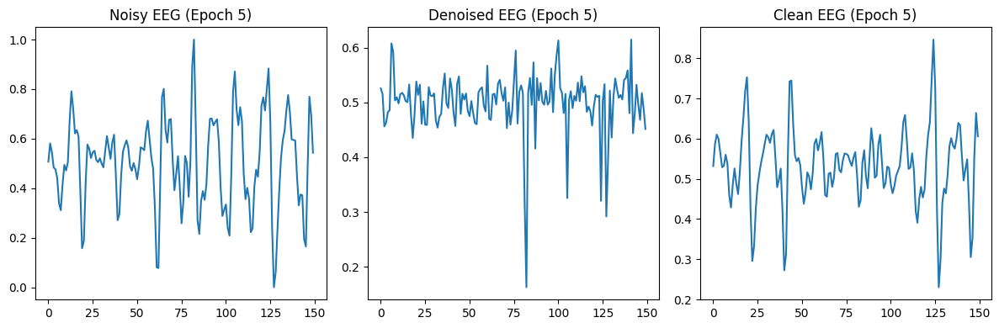

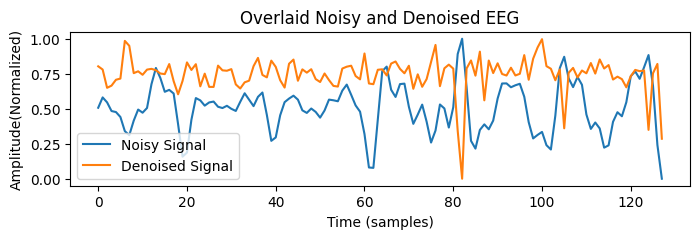

Epoch [6/50], Generator Loss: -0.4195, Critic Loss: -0.0149


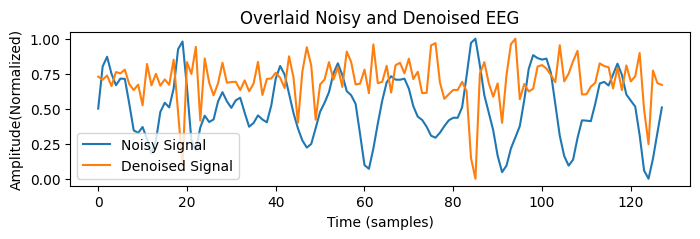

Epoch [7/50], Generator Loss: -0.4057, Critic Loss: -0.0584


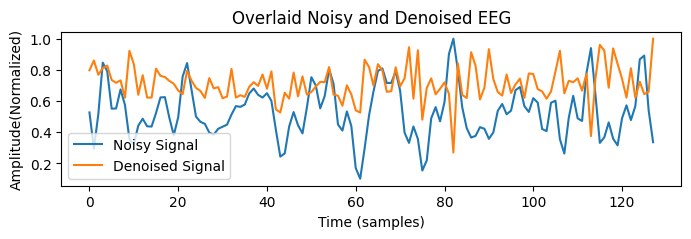

Epoch [8/50], Generator Loss: -0.4049, Critic Loss: -0.0759


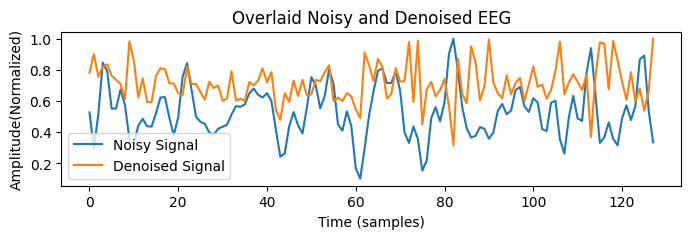

Epoch [9/50], Generator Loss: -0.4878, Critic Loss: -0.1244


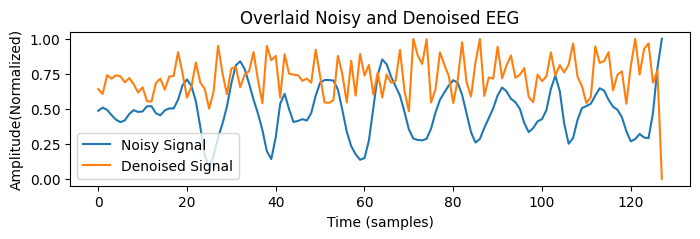

Epoch [10/50], Generator Loss: -0.3354, Critic Loss: -0.0403


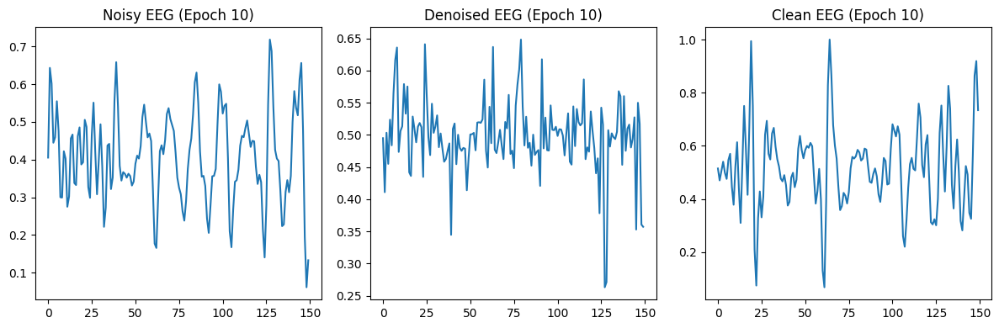

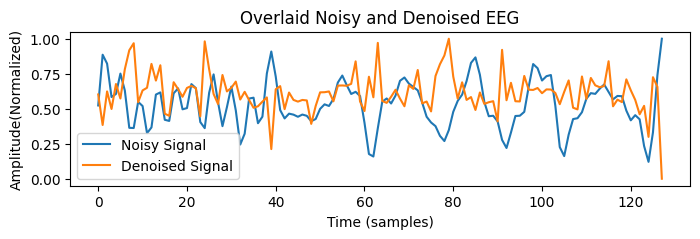

Epoch [11/50], Generator Loss: -0.3444, Critic Loss: -0.0579


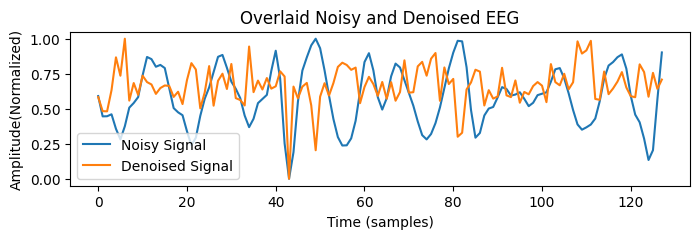

Epoch [12/50], Generator Loss: -0.5237, Critic Loss: -0.0087


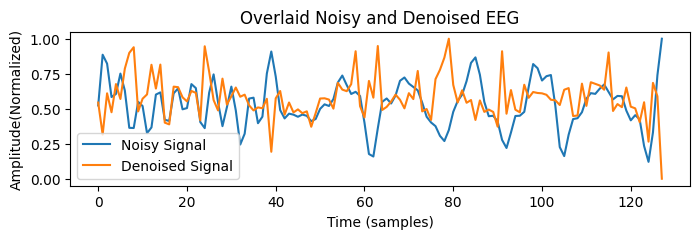

Epoch [13/50], Generator Loss: -0.3682, Critic Loss: -0.0429


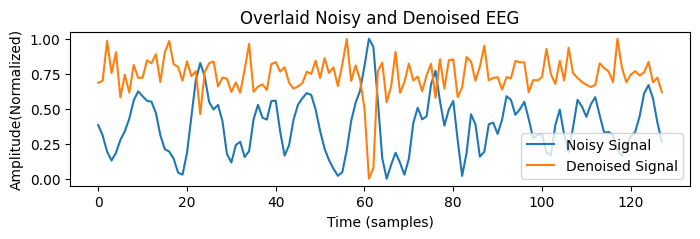

Epoch [14/50], Generator Loss: -0.3018, Critic Loss: -0.1944


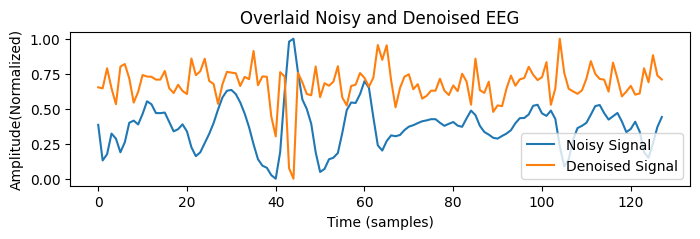

Epoch [15/50], Generator Loss: -0.1901, Critic Loss: -0.5484


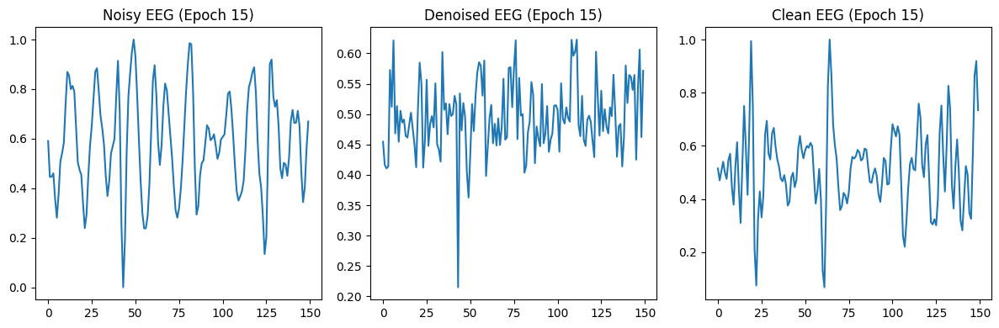

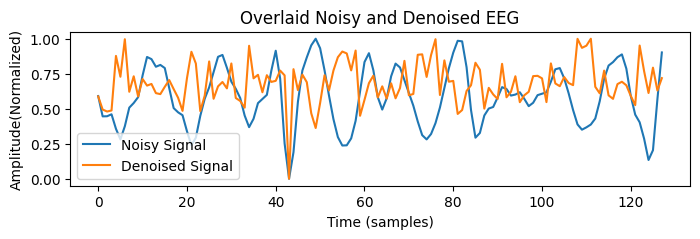

Epoch [16/50], Generator Loss: -0.5966, Critic Loss: -0.0979


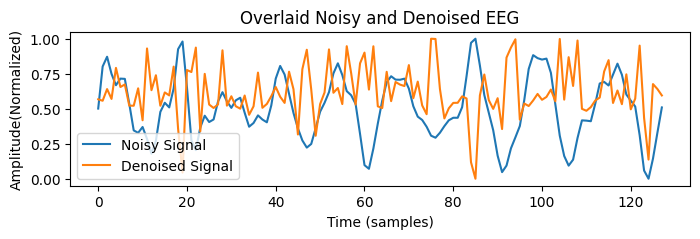

Epoch [17/50], Generator Loss: -0.6359, Critic Loss: -0.0701


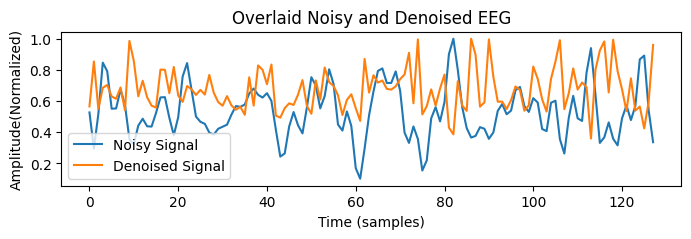

Epoch [18/50], Generator Loss: -0.5530, Critic Loss: -0.1126


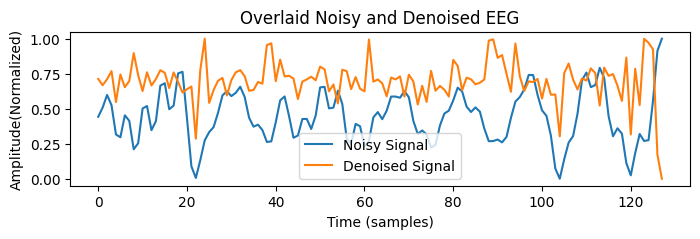

Epoch [19/50], Generator Loss: -0.7545, Critic Loss: -0.0213


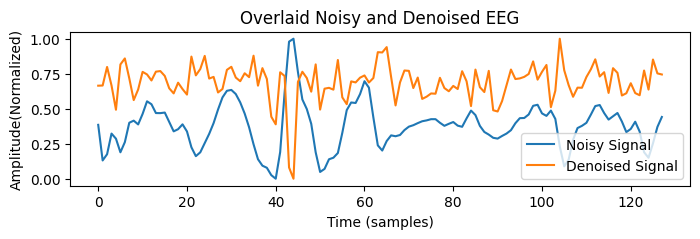

Epoch [20/50], Generator Loss: -0.5300, Critic Loss: -0.1598


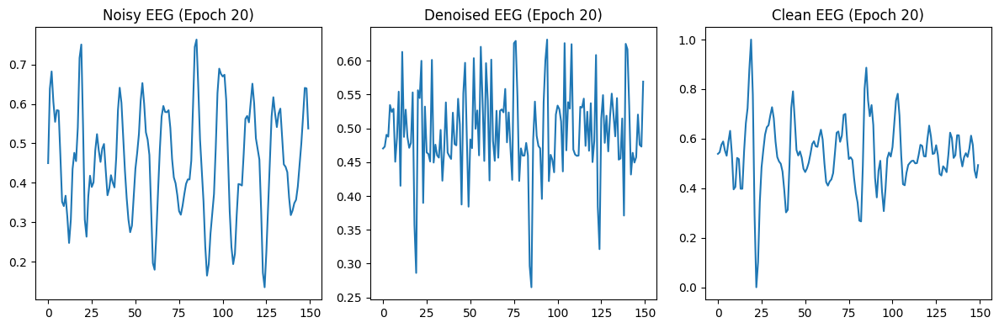

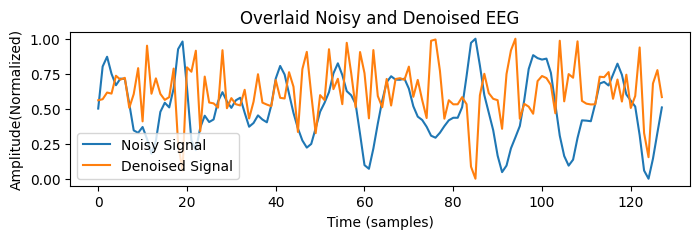

Epoch [21/50], Generator Loss: -0.5636, Critic Loss: -0.1411


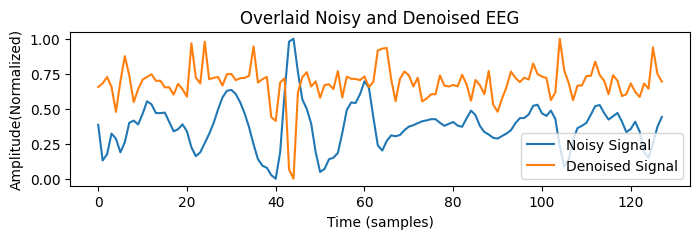

Epoch [22/50], Generator Loss: -0.5633, Critic Loss: -0.0825


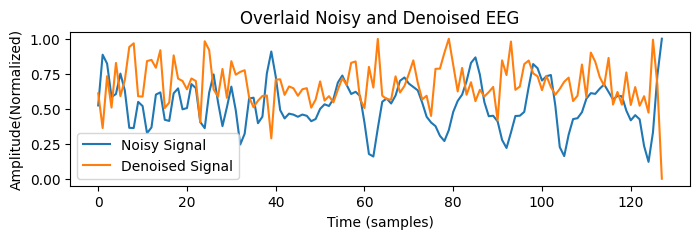

Epoch [23/50], Generator Loss: -0.6182, Critic Loss: -0.1363


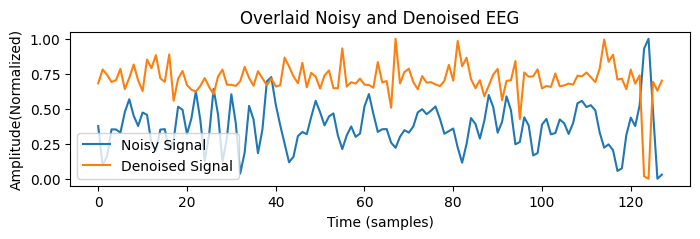

Epoch [24/50], Generator Loss: -0.4853, Critic Loss: -0.4020


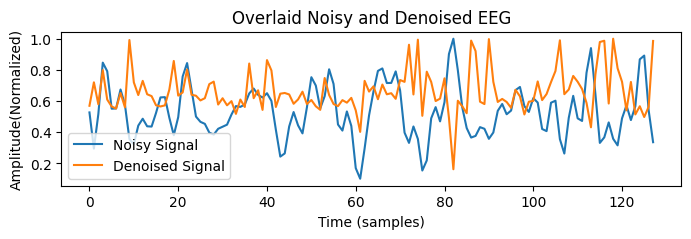

Epoch [25/50], Generator Loss: -0.6638, Critic Loss: -0.1840


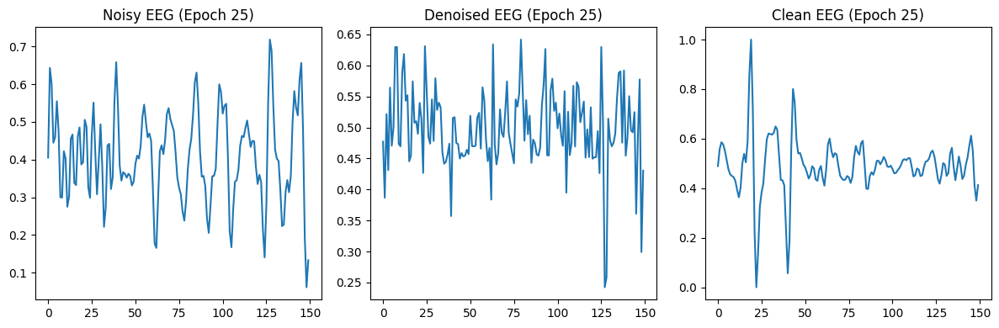

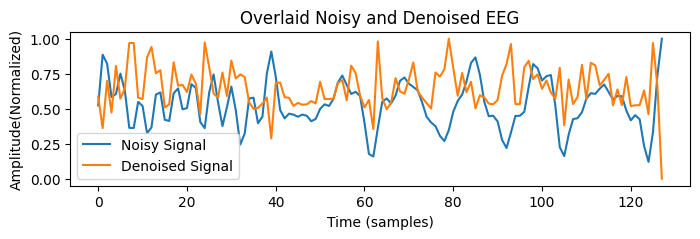

Epoch [26/50], Generator Loss: -0.4320, Critic Loss: -0.3951


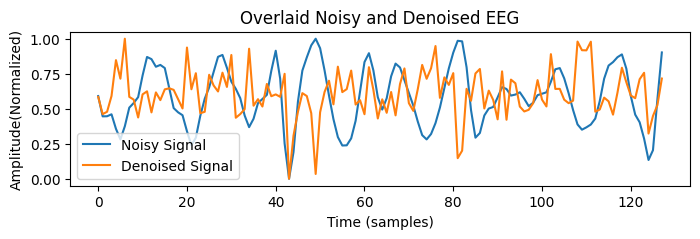

Epoch [27/50], Generator Loss: -0.8246, Critic Loss: -0.0516


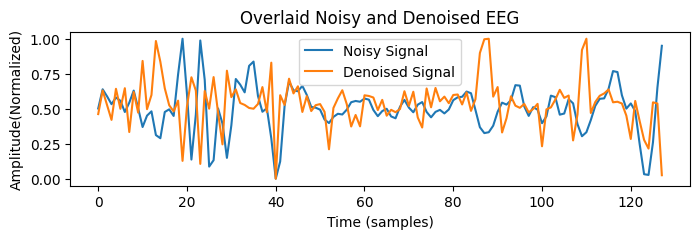

Epoch [28/50], Generator Loss: -0.3709, Critic Loss: -0.5157


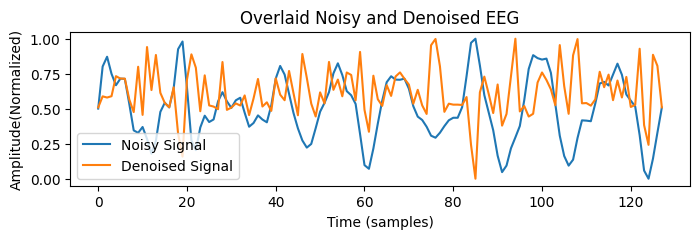

Epoch [29/50], Generator Loss: -0.4164, Critic Loss: -0.2514


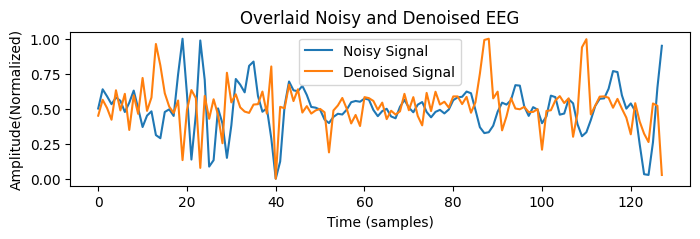

Epoch [30/50], Generator Loss: -0.3940, Critic Loss: -0.1370


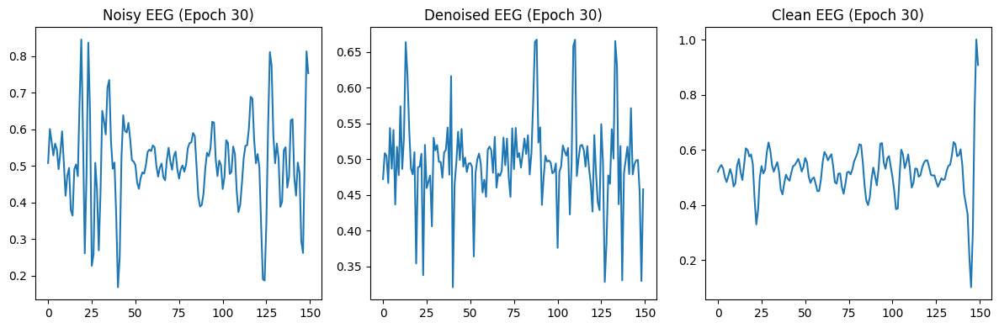

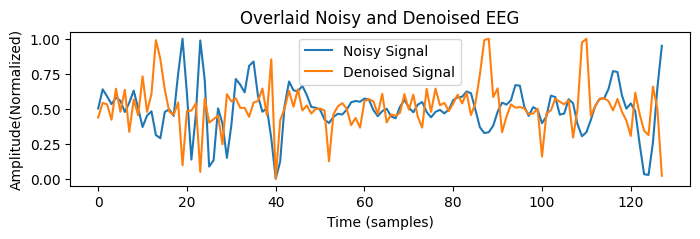

Epoch [31/50], Generator Loss: -0.2804, Critic Loss: -0.6248


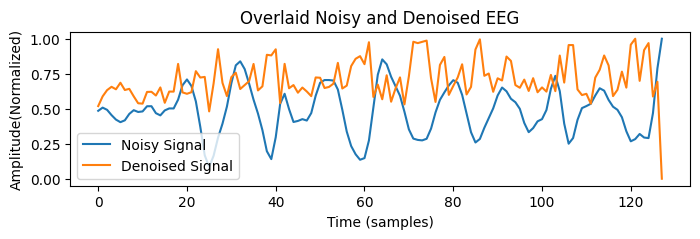

Epoch [32/50], Generator Loss: -0.2953, Critic Loss: -0.6260


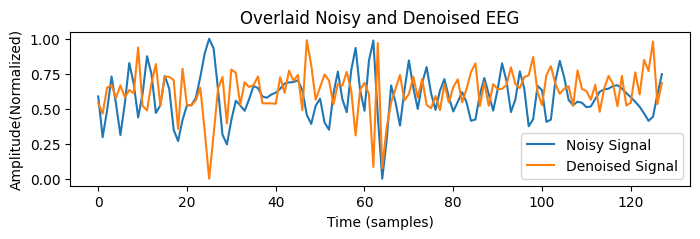

Epoch [33/50], Generator Loss: -0.2575, Critic Loss: -0.6429


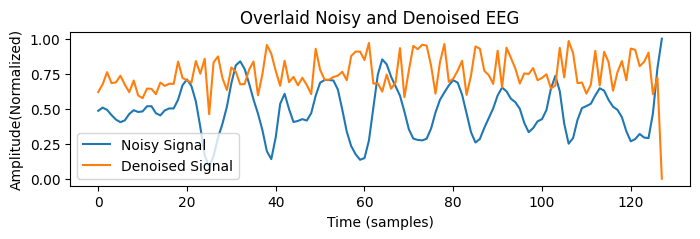

Epoch [34/50], Generator Loss: -0.8862, Critic Loss: -0.0282


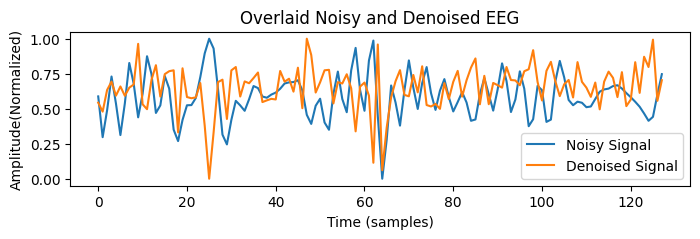

Epoch [35/50], Generator Loss: -0.4119, Critic Loss: -0.4128


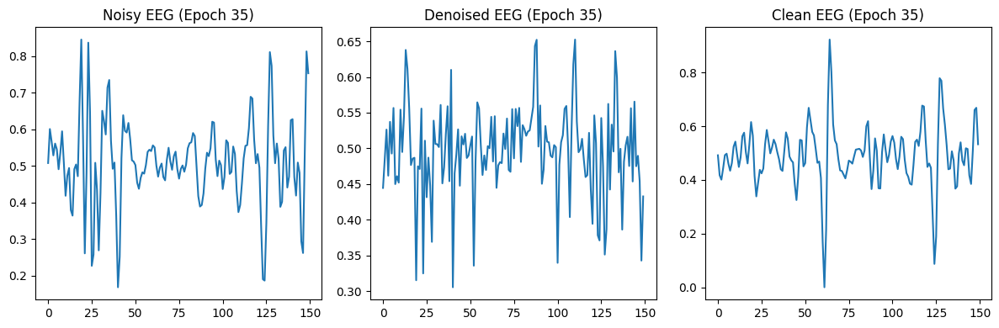

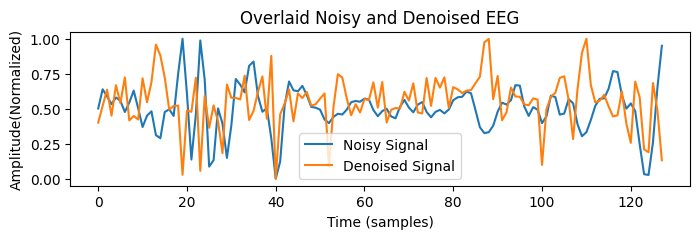

Epoch [36/50], Generator Loss: -0.3157, Critic Loss: -0.5589


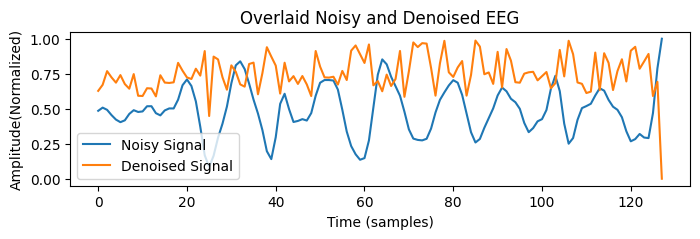

Epoch [37/50], Generator Loss: -0.2486, Critic Loss: -0.6043


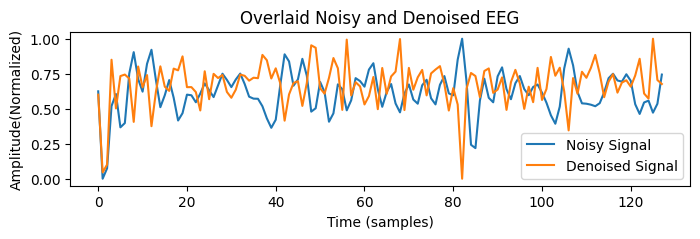

Epoch [38/50], Generator Loss: -0.2178, Critic Loss: -0.7017


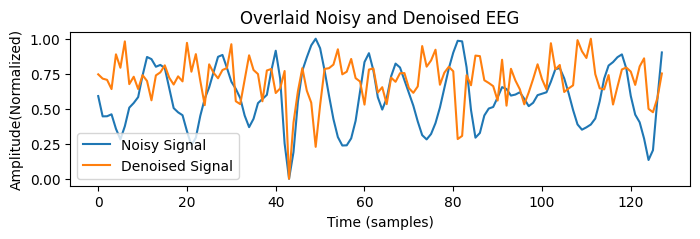

Epoch [39/50], Generator Loss: -0.2028, Critic Loss: -0.7090


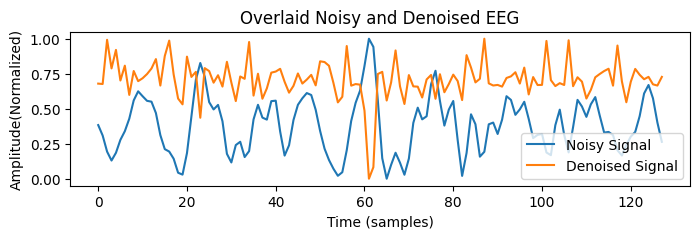

Epoch [40/50], Generator Loss: -0.8971, Critic Loss: -0.1865


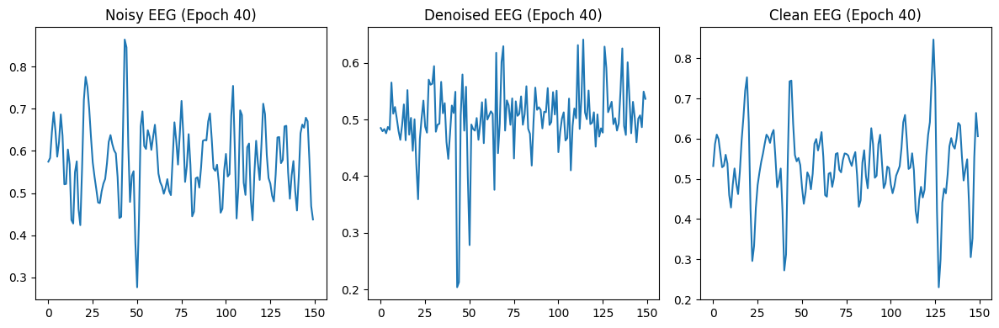

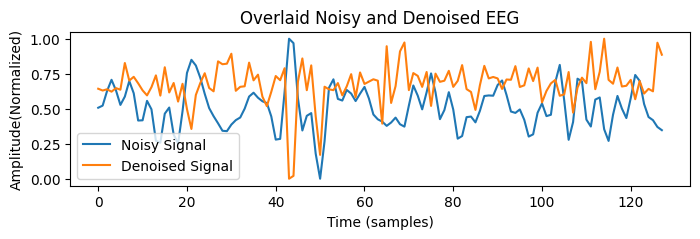

Epoch [41/50], Generator Loss: -0.5865, Critic Loss: -0.2670


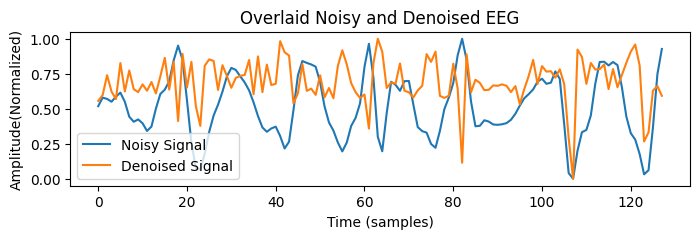

Epoch [42/50], Generator Loss: -0.3454, Critic Loss: -0.5058


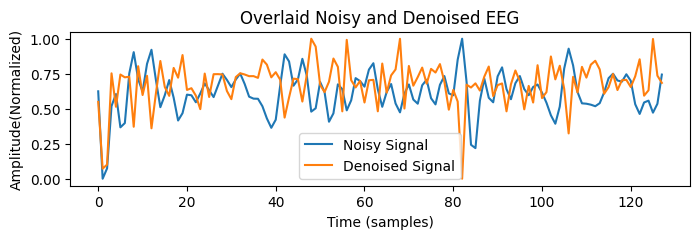

Epoch [43/50], Generator Loss: -0.7186, Critic Loss: -0.1176


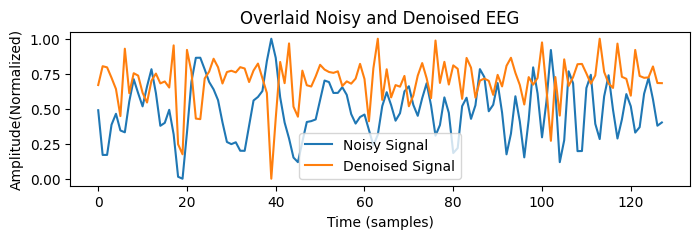

Epoch [44/50], Generator Loss: -0.3410, Critic Loss: -0.5644


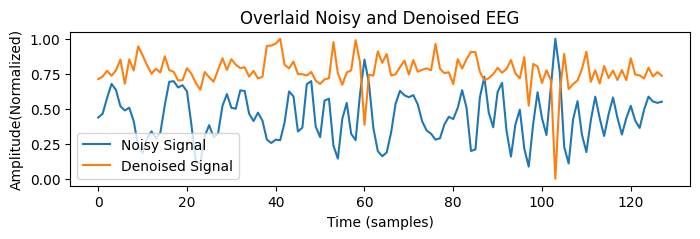

Epoch [45/50], Generator Loss: -0.9151, Critic Loss: 0.0131


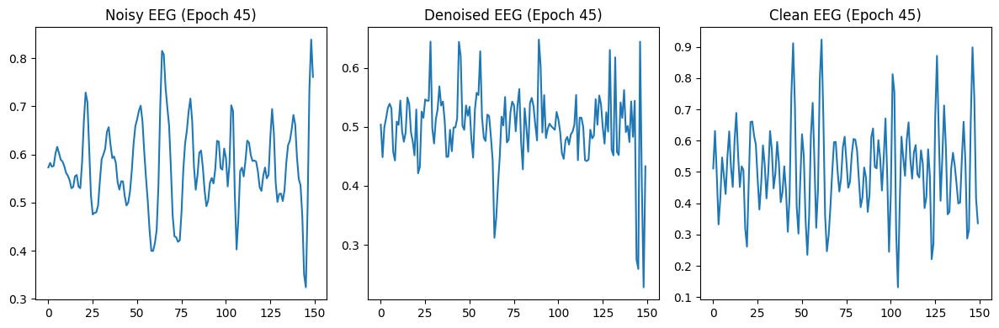

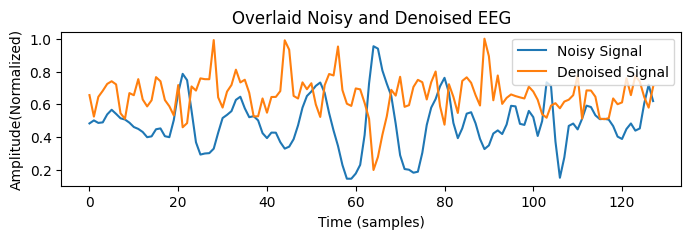

Epoch [46/50], Generator Loss: -0.8831, Critic Loss: -0.0117


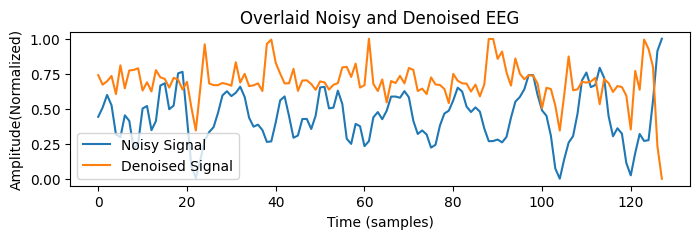

Epoch [47/50], Generator Loss: -0.8497, Critic Loss: -0.0688


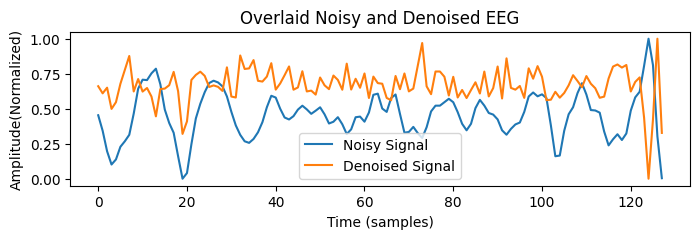

Epoch [48/50], Generator Loss: -0.8876, Critic Loss: -0.0225


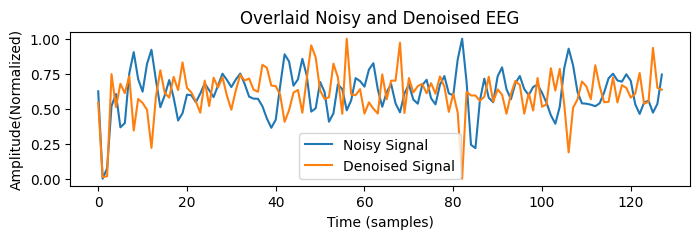

Epoch [49/50], Generator Loss: -0.5743, Critic Loss: -0.1362


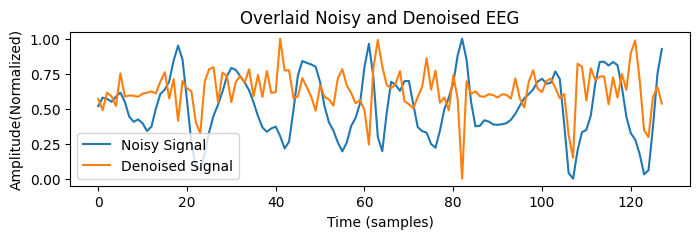

In [ ]:
def train_EEGwgan(generator, critic, noisy_dataloader, clean_dataloader, num_epochs=100, lr=0.00002, plot_interval=5, n_critic=10, weight_clipping_limit=0.1):

    content_loss = nn.MSELoss()

    optimizer_g = optim.Adam(generator.parameters(), lr=0.000015, betas=(0.5, 0.999))
    optimizer_c = optim.Adam(critic.parameters(), lr=0.0005, betas=(0.5, 0.999))

    generator.train()
    critic.train()

    generator_losses = []
    critic_losses = []

    for epoch in range(num_epochs):
        for (noisy, _), (clean, _) in zip(noisy_dataloader, clean_dataloader):

            clean_eeg = clean[0].to(device)
            noisy_eeg = noisy[0].to(device)

            # ====================
            # Train Critic
            # ====================
            for _ in range(n_critic):
                optimizer_c.zero_grad()

                # Real EEG input
                real_outputs = critic(clean_eeg.unsqueeze(2)).to(device)
                loss_c_real = -torch.mean(real_outputs)  # WGAN loss for real data

                # Fake EEG input
                denoised_data = generator(noisy_eeg.unsqueeze(2)).to(device)
                fake_outputs = critic(denoised_data.detach().squeeze(0)).to(device)
                loss_c_fake = torch.mean(fake_outputs)  # WGAN loss for fake data

                # Combined critic loss
                loss_c = loss_c_real + loss_c_fake
                loss_c.backward()
                optimizer_c.step()

                # Weight clipping for critic (enforcing Lipschitz constraint)
                for p in critic.parameters():
                    p.data.clamp_(-weight_clipping_limit, weight_clipping_limit)

            # ====================
            # Train Generator
            # ====================
            optimizer_g.zero_grad()

            denoised_data = generator(noisy_eeg.unsqueeze(2))
            fake_outputs = critic(denoised_data.squeeze(0)).to(device)

            # Adversarial loss for generator
            loss_g_adv = -torch.mean(fake_outputs)  # WGAN loss for generator

            # Content loss (MSE)
            loss_g_content = content_loss(denoised_data, clean_eeg.unsqueeze(2))

            # Combined generator loss
            loss_g = loss_g_adv + 0.5 * loss_g_content

            loss_g.backward()
            optimizer_g.step()

        generator_losses.append(loss_g.item())
        critic_losses.append(loss_c.item())

        print(f"Epoch [{epoch}/{num_epochs}], Generator Loss: {loss_g.item():.4f}, Critic Loss: {loss_c.item():.4f}")


        # Plot signals at specified intervals
        if epoch % plot_interval == 0:
            plot_eeg_signals(epoch, noisy_eeg, denoised_data, clean_eeg)

        # Normalize the signals
        noisy_normalized = (noisy_eeg - torch.min(noisy_eeg)) / (torch.max(noisy_eeg) - torch.min(noisy_eeg))
        denoised_normalized = (denoised_data - torch.min(denoised_data)) / (torch.max(denoised_data) - torch.min(denoised_data))

        # Plot the normalized signals overlaid
        plt.figure(figsize=(8, 2))
        plt.plot(noisy_normalized[:128, 0].detach().cpu().numpy(), label='Noisy Signal')
        plt.plot(denoised_normalized[:128, 0].detach().cpu().numpy(), label='Denoised Signal')
        plt.title('Overlaid Noisy and Denoised EEG')
        plt.xlabel('Time (samples)')
        plt.ylabel('Amplitude(Normalized)')
        plt.legend()
        plt.show()


    return generator_losses, critic_losses


input_size = 1 #channel of the each signal
output_size = 1
seq_len=150
num_epochs = 50

generator = Generator(input_size, output_size, seq_len).to(device)
discriminator = Discriminator(input_size, seq_len).to(device)

#Train the model
generator_losses, discriminator_losses= train_EEGwgan(generator, discriminator, unhealthy_loader_train, healthy_loader_train, num_epochs=num_epochs)

##Plot the loss

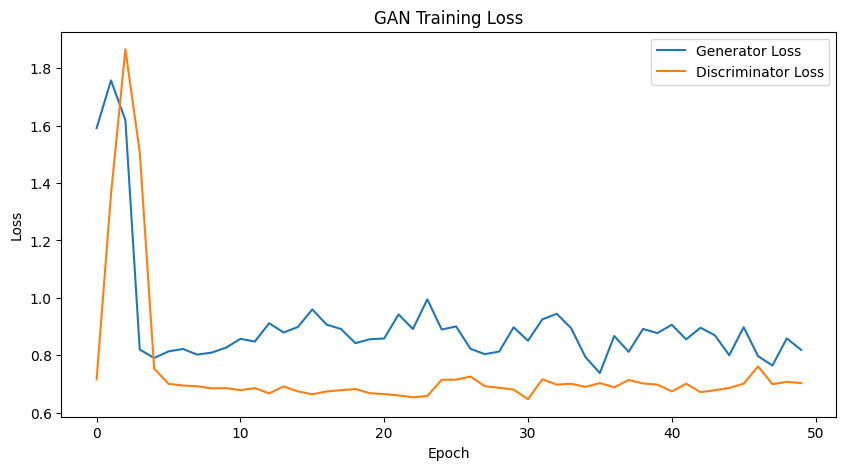

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(generator_losses, label='Generator Loss')
plt.plot(discriminator_losses, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('GAN Training Loss')
plt.show()

##Test GAN model with loss

###Taking different channel for testing

In [ ]:
# Keep only column with 'C' in each DataFrame
unhealthy_dataframe_test = [df[['Cz']] for df in unhealthy_dataframe]
healthy_dataframe_test = [df[['Cz']] for df in healthy_dataframe]

#Print each dataframe
print(f"---------UNHEALTHY:{len(unhealthy_dataframe_test)} Dataframe ---------")
print_dataframes_with_labels(unhealthy_dataframe_test, labels_unhealthy)
print("\n")
print(f"---------HEALTHY:{len(healthy_dataframe_test)} Dataframe ---------")
print_dataframes_with_labels(healthy_dataframe_test, labels_healthy)

def df_to_tensor(df, label=None):
    # Convert DataFrame to NumPy array with float32 dtype
    array = np.array(df, dtype=np.float32)

    # Convert NumPy array to tensor
    tensor = torch.tensor(array)

    return tensor, label

#Convert tensor with label
def convert_to_tensors_with_labels(dataframes, labels):
    tensors_with_labels = []
    for df, label in zip(dataframes, labels):
        tensor, labeled_tensor = df_to_tensor(df, label=label)
        tensors_with_labels.append((tensor, labeled_tensor))
    return tensors_with_labels

unhealthy_tensors_test = convert_to_tensors_with_labels(unhealthy_dataframe_test, labels_unhealthy[:len(unhealthy_dataframe_test)])
healthy_tensors_test = convert_to_tensors_with_labels(healthy_dataframe_test, labels_healthy[:len(healthy_dataframe_test)])

def filter_tensors(labeled_tensors, threshold_shape):
    filtered_tensors = []
    for tensor, label in labeled_tensors:
        if tensor.shape[0] >= threshold_shape[0] and tensor.shape[1] >= threshold_shape[1]:
            # If tensor shape is larger than threshold, resize or crop it
            tensor_filtered = tensor[:threshold_shape[0], :threshold_shape[1]]

            filtered_tensors.append((tensor_filtered, label))

    return filtered_tensors

# Define the threshold shape
threshold_unhealthy = (150, 1)
threshold_healthy = (150, 1)

unhealthy_tensors_test = filter_tensors(unhealthy_tensors_test, threshold_unhealthy)
healthy_tensors_test = filter_tensors(healthy_tensors_test, threshold_healthy)

# Print the tensors with labels and shapes
print(f"---------UNHEALTHY:{len(unhealthy_tensors_test)} Tensor---------")
for tensor, label in unhealthy_tensors_test:
    print("Label:", label)
    print("Tensor Shape:", tensor.shape)
    print("Tensor:")
    print(tensor)
    print("------------------")

print("\n")

print(f"---------HEALTHY:{len(healthy_tensors_test)} Tensor---------")
for tensor, label in healthy_tensors_test:
    print("Label:", label)
    print("Tensor Shape:", tensor.shape)
    print("Tensor:")
    print(tensor)
    print("------------------")

---------UNHEALTHY:21 Dataframe ---------
Label: S1E1
Dataframe:
           Cz
0    0.524481
1    0.493265
2    0.457878
3    0.454364
4    0.497196
..        ...
730  0.562389
731  0.541266
732  0.491423
733  0.477280
734  0.524481

[735 rows x 1 columns]
------------------
Label: S1E2
Dataframe:
           Cz
0    0.525751
1    0.440929
2    0.450554
3    0.473965
4    0.420008
..        ...
625  0.552293
626  0.575704
627  0.505922
628  0.459274
629  0.525751

[630 rows x 1 columns]
------------------
Label: S1E3
Dataframe:
           Cz
0    0.533404
1    0.465204
2    0.499064
3    0.573291
4    0.584340
..        ...
583  0.497549
584  0.633697
585  0.620270
586  0.538616
587  0.533404

[588 rows x 1 columns]
------------------
Label: S2E1
Dataframe:
           Cz
0    0.454752
1    0.450793
2    0.423214
3    0.398720
4    0.424911
..        ...
184  0.577336
185  0.678279
186  0.994792
187  1.000000
188  0.454752

[189 rows x 1 columns]
------------------
Label: S2E2
Dataframe:

In [ ]:
#Create a DataLoader for the training unhealthy and healthy data
batch_size = 32

unhealthy_loader_test = DataLoader(unhealthy_tensors_test, batch_size=batch_size, shuffle=True)
healthy_loader_test = DataLoader(healthy_tensors_test, batch_size=batch_size, shuffle=True)

In [ ]:
def test_EEGgan(generator, noisy_dataloader, clean_dataloader):

    generator.eval()
    loss_fn= nn.MSELoss()

    for (noisy, _), (clean, _) in zip(noisy_dataloader, clean_dataloader):

        clean_eeg = clean[0].to(device)
        noisy_eeg = noisy[0].to(device)

        denoised_eeg = generator(noisy_eeg.unsqueeze(2)).squeeze(0).detach()

        generator_loss = loss_fn(denoised_eeg, clean_eeg.unsqueeze(2))

        print("Generator Loss:", generator_loss.item())

    return clean_eeg, noisy_eeg, denoised_eeg, generator_loss

input_size = 1
output_size = 1
seq_len= 150

generator = Generator(input_size, output_size, seq_len).to(device)

#generator.load_state_dict(torch.load(save_path+'/Gen/generator_epoch_24.pt', weights_only=True))

clean_eeg, noisy_eeg, denoised_eeg, generator_loss = test_EEGgan(generator, unhealthy_loader_test, healthy_loader_test)

Generator Loss: 0.012078341096639633


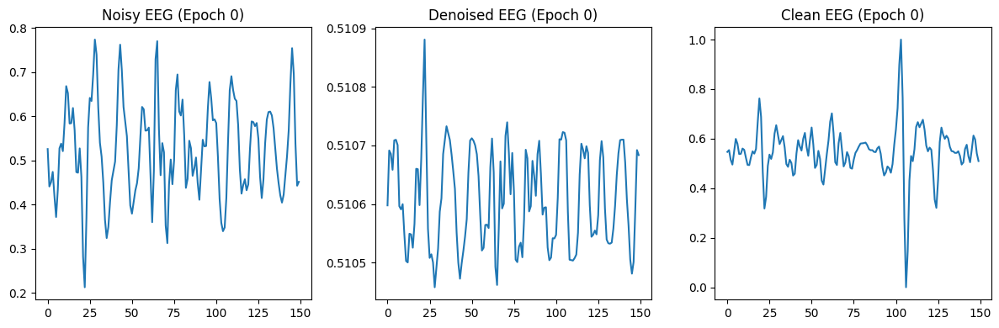

In [ ]:
plot_eeg_signals(0, noisy_eeg, denoised_eeg, clean_eeg)

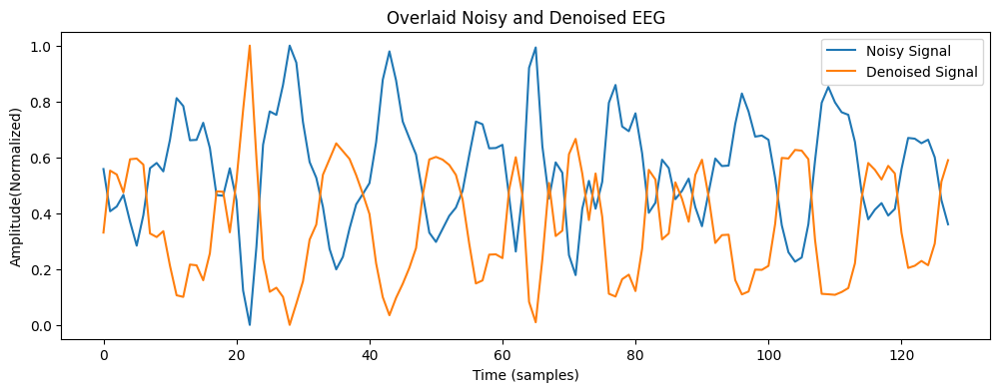

In [ ]:
# prompt: how to plot the noisy signal and the denoised signal overlaid but has different amplitude , i want normalize the amplitude and overlaid them

# Normalize the signals
clean_normalized = (clean_eeg - torch.min(clean_eeg)) / (torch.max(clean_eeg) - torch.min(clean_eeg))
noisy_normalized = (noisy_eeg - torch.min(noisy_eeg)) / (torch.max(noisy_eeg) - torch.min(noisy_eeg))
denoised_normalized = (denoised_eeg - torch.min(denoised_eeg)) / (torch.max(denoised_eeg) - torch.min(denoised_eeg))

# Plot the normalized signals overlaid
plt.figure(figsize=(12, 4))
plt.plot(noisy_normalized[:128, 0].detach().cpu().numpy(), label='Noisy Signal')
plt.plot(denoised_normalized[:128, 0].detach().cpu().numpy(), label='Denoised Signal')
plt.title('Overlaid Noisy and Denoised EEG')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude(Normalized)')
plt.legend()
plt.show()

#Evaluation of denoised signal

*   PSD(Power Spectral Density of EEG)
*   Power Ratio
*   RRMSE
*   SNR (ground truth)






In [ ]:
import numpy as np
from scipy import signal as sig

def compute_psd(signal):
  """
  Returns:
    freqs: An array of frequencies.
    psd: An array of power values corresponding to the frequencies.
  """
  freqs, psd = sig.welch(signal, fs=128.0, nfft=len(signal), nperseg=len(signal))
  return freqs, psd

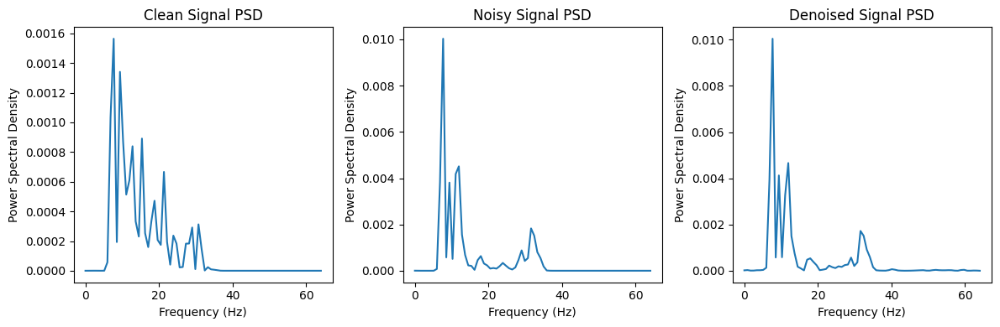

In [ ]:
y_freq,y_psd=compute_psd(clean_normalized[:, 0].detach().cpu().numpy())
x_freq,x_psd=compute_psd(noisy_normalized[:, 0].detach().cpu().numpy())
d_freq,d_psd=compute_psd(denoised_normalized[:, 0, 0].detach().cpu().numpy())

# Plot PSD for each signal
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(y_freq, y_psd)
plt.title('Clean Signal PSD')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')

plt.subplot(1, 3, 2)
plt.plot(x_freq, x_psd)
plt.title('Noisy Signal PSD')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')

plt.subplot(1, 3, 3)
plt.plot(d_freq, d_psd)
plt.title('Denoised Signal PSD')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')

plt.tight_layout()
plt.show()

In [ ]:
def power_ratio(signal, bands):
  """
  Computes the power ratio of different frequency bands in an EEG signal.

  Args:
    signal: The EEG signal.
    bands: A dictionary defining the frequency bands.

  Returns:
    A dictionary containing the power ratio for each frequency band.
  """
  freqs, psd = compute_psd(signal)
  power_ratio = {}
  for band_name, (low, high) in bands.items():
    freq_mask = (freqs >= low) & (freqs <= high)
    band_power = np.sum(psd[freq_mask])
    power_ratio[band_name] = band_power
  total_power = np.sum(list(power_ratio.values()))
  for band_name in power_ratio:
    power_ratio[band_name] /= total_power

  return power_ratio

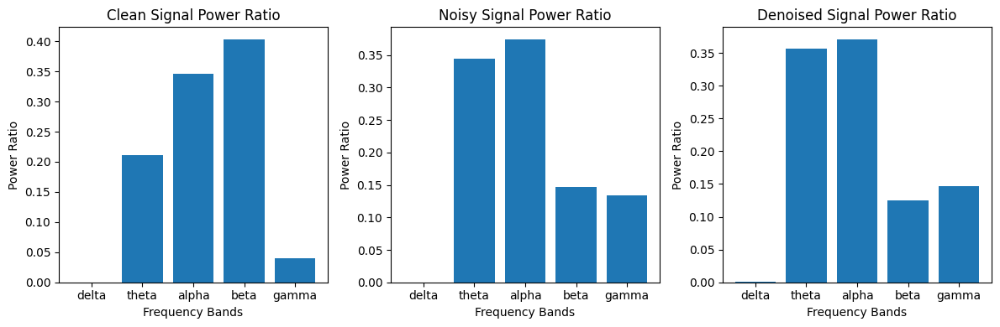

In [ ]:
# Define frequency bands
bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta': (13, 30),
    'gamma': (30, 80)
}

# Calculate power ratios for each signal
clean_power_ratio = power_ratio(clean_normalized[:, 0].detach().cpu().numpy(), bands)
noisy_power_ratio = power_ratio(noisy_normalized[:, 0].detach().cpu().numpy(), bands)
denoised_power_ratio = power_ratio(denoised_normalized[:, 0, 0].detach().cpu().numpy(), bands)

# Extract band names and power ratios for plotting
clean_bands = list(clean_power_ratio.keys())
clean_values = list(clean_power_ratio.values())
noisy_bands = list(noisy_power_ratio.keys())
noisy_values = list(noisy_power_ratio.values())
denoised_bands = list(denoised_power_ratio.keys())
denoised_values = list(denoised_power_ratio.values())

# Plot power ratios
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.bar(clean_bands, clean_values)
plt.title('Clean Signal Power Ratio')
plt.xlabel('Frequency Bands')
plt.ylabel('Power Ratio')

plt.subplot(1, 3, 2)
plt.bar(noisy_bands, noisy_values)
plt.title('Noisy Signal Power Ratio')
plt.xlabel('Frequency Bands')
plt.ylabel('Power Ratio')

plt.subplot(1, 3, 3)
plt.bar(denoised_bands, denoised_values)
plt.title('Denoised Signal Power Ratio')
plt.xlabel('Frequency Bands')
plt.ylabel('Power Ratio')

plt.tight_layout()
plt.show()

In [ ]:
def compute_spectral_rrmse(clean_signal, denoised_signal):
  """
  Computes the spectral Root Mean Squared Root Error (RRMSE) between two signals.

  Args:
    clean_signal: The clean EEG signal.
    denoised_signal: The denoised EEG signal.

  Returns:
    spectral_rrmse: The spectral RRMSE value.
  """
  # Calculate the PSD for both signals
  freqs_clean, psd_clean = compute_psd(clean_signal)
  freqs_denoised, psd_denoised = compute_psd(denoised_signal)

  # Find the common frequencies
  common_freqs = np.intersect1d(freqs_clean, freqs_denoised)

  # Extract PSD values for common frequencies
  psd_clean_common = [psd_clean[np.where(freqs_clean == freq)][0] for freq in common_freqs]
  psd_denoised_common = [psd_denoised[np.where(freqs_denoised == freq)][0] for freq in common_freqs]

  # Calculate the squared difference between PSD values
  squared_diff = [(x - y) ** 2 for x, y in zip(psd_clean_common, psd_denoised_common)]

  # Calculate the mean squared error
  mse = np.mean(squared_diff)

  # Calculate the spectral RRMSE
  spectral_rrmse = np.sqrt(mse)

  return spectral_rrmse

# Calculate spectral RRMSE
spectral_rrmse = compute_spectral_rrmse(clean_normalized[:, 0].detach().cpu().numpy(), denoised_normalized[:, 0, 0].detach().cpu().numpy())

# Print the spectral RRMSE value
print("Spectral RRMSE:", spectral_rrmse)

Spectral RRMSE: 0.0012579715647527126


In [ ]:
import numpy as np

def compute_temporal_rrmse(clean_signal, denoised_signal):
  """
  Computes the temporal Root Mean Squared Root Error (RRMSE) between two signals.

  Args:
    clean_signal: The clean EEG signal.
    denoised_signal: The denoised EEG signal.

  Returns:
    temporal_rrmse: The temporal RRMSE value.
  """
  # Calculate the squared difference between the signals
  squared_diff = [(x - y) ** 2 for x, y in zip(clean_signal, denoised_signal)]

  # Calculate the mean squared error
  mse = np.mean(squared_diff)

  # Calculate the temporal RRMSE
  temporal_rrmse = np.sqrt(mse)

  return temporal_rrmse

# Calculate spectral RRMSE
temporal_rrmse = compute_temporal_rrmse(clean_normalized[:, 0].detach().cpu().numpy(), denoised_normalized[:, 0, 0].detach().cpu().numpy())

# Print the spectral RRMSE value
print("Temporal RRMSE:", temporal_rrmse)

Temporal RRMSE: 0.32990812200393815


SNR: 2.237433046102524


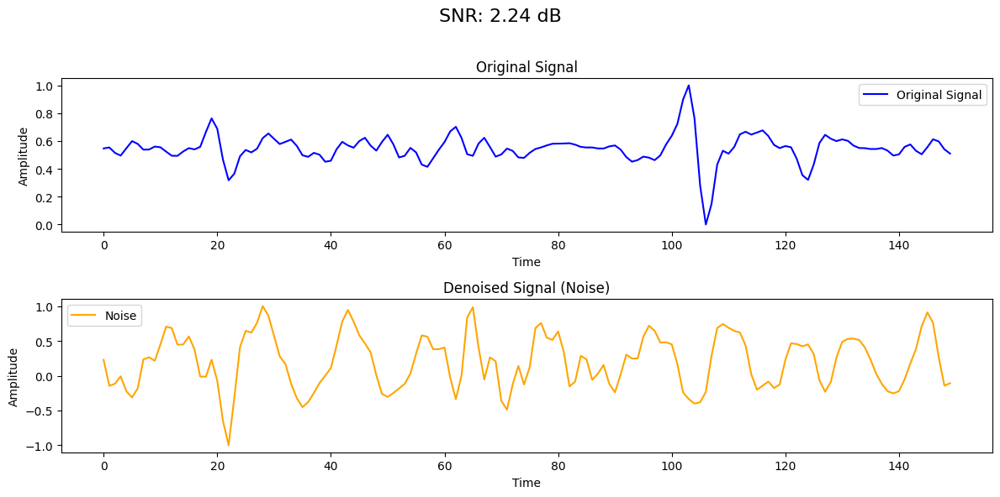

In [ ]:
#ground truth
def snr_gt(signal, noise):
  """
  Computes the Signal-to-Noise Ratio (SNR) between a signal and noise.

  Args:
    signal: The signal array.
    noise: The noise array.

  Returns:
    snr: The SNR value in dB.
  """
  signal_power = np.mean(signal ** 2)
  noise_power = np.mean(noise ** 2)
  snr = 10 * np.log10(signal_power / noise_power)
  return snr

# Calculate SNR
snr = snr_gt(clean_normalized[:, 0].detach().cpu().numpy(), (noisy_normalized[:, 0].detach().cpu().numpy() - denoised_normalized[:, 0, 0].detach().cpu().numpy()))

# Print the SNR value
print("SNR:", snr)

# Plot the signal and noise
plt.figure(figsize=(12, 6))

# Plot the original signal
plt.subplot(2, 1, 1)
plt.plot(clean_normalized[:, 0].detach().cpu().numpy(), label='Original Signal', color='blue')
plt.title("Original Signal")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.legend()

# Plot the denoised signal (or noise)
plt.subplot(2, 1, 2)
plt.plot(noisy_normalized[:, 0].detach().cpu().numpy() - denoised_normalized[:, 0, 0].detach().cpu().numpy(), label='Noise', color='orange')
plt.title("Denoised Signal (Noise)")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.legend()

# Display the SNR value in the plot
plt.suptitle(f"SNR: {snr:.2f} dB", fontsize=16)

# Show the plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

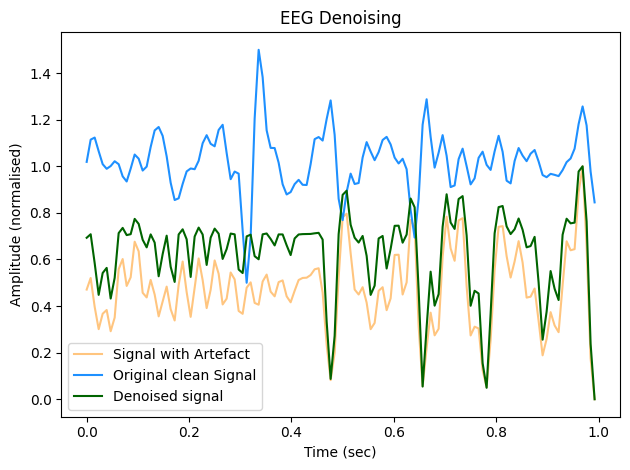

In [ ]:
Fs = 128.0
Ts = 1.0/Fs
sig_len = len(clean_normalized[:,0].detach().cpu().numpy())//Fs
t = np.arange(0, sig_len, Ts)

plt.plot(t, noisy_normalized[:128, 0].detach().cpu().numpy(), label = 'Signal with Artefact', alpha=0.5, c='darkorange')
plt.plot(t, clean_normalized[:128,0].detach().cpu().numpy() + 0.5, label = 'Original clean Signal', c='dodgerblue')
plt.plot(t, denoised_normalized[:128,0,0].detach().cpu().numpy() , label = 'Denoised signal', c='darkgreen' )
plt.title('EEG Denoising')
plt.xlabel('Time (sec)')
plt.ylabel('Amplitude (normalised)')
plt.legend()
plt.tight_layout()